# CODICE FINALE!!!

Usare python <3.10

In [2]:
%pip install seaborn

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.1.1 -> 24.3.1
[notice] To update, run: /Applications/Xcode.app/Contents/Developer/usr/bin/python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importiamo le librerie necessarie
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

# Caricamento dei dati (modifica i percorsi ai tuoi file)
print("=== 1. Lettura dei CSV ===")
transfers = pd.read_csv("../Datasets/SNA/transfers.csv")
clubs = pd.read_csv("../Datasets/SNA/clubs.csv")

# Verifica dei dati caricati
print("\nAnteprima del dataset Clubs:")
print(clubs.head())

print("\nAnteprima del dataset Transfers:")
print(transfers.head())


=== 1. Lettura dei CSV ===

Anteprima del dataset Clubs:
   club_id          club_code                             name  \
0      105    sv-darmstadt-98                  SV Darmstadt 98   
1    11127  ural-ekaterinburg               Ural Yekaterinburg   
2      114  besiktas-istanbul        Beşiktaş Jimnastik Kulübü   
3       12             as-rom       Associazione Sportiva Roma   
4      148  tottenham-hotspur  Tottenham Hotspur Football Club   

  domestic_competition_id  total_market_value  squad_size  average_age  \
0                      L1                 NaN          27         25.6   
1                     RU1                 NaN          30         26.5   
2                     TR1                 NaN          31         26.4   
3                     IT1                 NaN          26         26.4   
4                     GB1                 NaN          27         25.5   

   foreigners_number  foreigners_percentage  national_team_players  \
0                 13           

In [4]:
# ------------------------------------------------------
# 2. CONVERSIONE DEI DATI
# ------------------------------------------------------
print("\n=== 2. Conversione dei club_id in entrambi i dataset ===")

# Assicuriamoci che 'club_id' sia un intero
clubs["club_id"] = clubs["club_id"].astype(int)
transfers["from_club_id"] = transfers["from_club_id"].astype(int)
transfers["to_club_id"] = transfers["to_club_id"].astype(int)

# Verifica che i tipi siano corretti
print(f"\nTipo di 'club_id' in clubs: {clubs['club_id'].dtype}")
print(f"Tipo di 'from_club_id' e 'to_club_id' in transfers: {transfers['from_club_id'].dtype}, {transfers['to_club_id'].dtype}")


=== 2. Conversione dei club_id in entrambi i dataset ===

Tipo di 'club_id' in clubs: int64
Tipo di 'from_club_id' e 'to_club_id' in transfers: int64, int64


In [5]:
# ------------------------------------------------------
# 3. CREAZIONE DEL DIZIONARIO CLUB_ID -> CLUB_NAME
# ------------------------------------------------------
print("\n=== 3. Creazione dizionario club_id -> club_name ===")
club_id_to_name = dict(zip(clubs["club_id"], clubs["name"]))

# Verifica del dizionario
print("\nEsempio di dizionario club_id -> club_name (primi 5):")
for i, (k, v) in enumerate(club_id_to_name.items()):
    if i >= 5:
        break
    print(f"{k} -> {v}")


=== 3. Creazione dizionario club_id -> club_name ===

Esempio di dizionario club_id -> club_name (primi 5):
105 -> SV Darmstadt 98
11127 -> Ural Yekaterinburg
114 -> Beşiktaş Jimnastik Kulübü
12 -> Associazione Sportiva Roma
148 -> Tottenham Hotspur Football Club


Dettaglio delle metriche:


	•	Numero di nodi: Calcola il numero di nodi nel grafo.
	•	Numero di archi: Calcola il numero di archi nel grafo.
	•	Densità: La densità di un grafo è il rapporto tra il numero di archi effettivi e il numero massimo di archi possibili in un grafo completo.
	•	Clustering medio: La media dei coefficienti di clustering per tutti i nodi del grafo. Indica la “densità” di connessioni tra vicini di un nodo.
	•	Raggio: Il raggio del grafo è la massima distanza più breve tra un nodo e qualsiasi altro nodo (solo nei grafi connessi).
	•	Diametro: Il diametro del grafo è la massima distanza tra due nodi qualsiasi (solo nei grafi connessi). (Uso average_clustering: Poiché stiamo lavorando con un grafo diretto, il calcolo del clustering viene fatto su una versione non diretta del grafo, utilizzando G.to_undirected(). Questo converte temporaneamente il grafo diretto in uno non diretto per il calcolo del clustering, che non è definito per i grafi diretti.)
	•	Grado dei nodi: Il grado di un nodo è il numero di archi incidenti su di esso. La funzione restituisce un dizionario con il grado per ogni nodo.
	•	Centralità di grado: La centralità di grado di un nodo è il rapporto tra il grado del nodo e il numero massimo di nodi che può avere.
	•	Centralità di betweenness: La centralità di betweenness misura quanto un nodo funge da ponte (o “mediator”) tra altri due nodi.
	•	Centralità di PageRank: Misura la “importanza” di un nodo basata sulla struttura del grafo, considerando la centralità dei suoi vicini.

In [6]:
import networkx as nx

def calculate_and_print_graph_metrics(G):
    # Numero di nodi
    num_nodes = G.number_of_nodes()

    # Numero di archi
    num_edges = G.number_of_edges()

    # Densità del grafo
    density = round(nx.density(G), 3)

    # Clustering medio (per grafi diretti)
    avg_clustering = round(nx.average_clustering(G.to_undirected()), 3)  # Usiamo la versione non diretta per il clustering

    # Verifica se il grafo è fortemente connesso
    if nx.is_strongly_connected(G):
        radius = nx.radius(G)
        diameter = nx.diameter(G)
    else:
        radius = None
        diameter = None

    # Grado dei nodi
    degree = dict(G.degree())

    # Centralità di grado
    degree_centrality = nx.degree_centrality(G)

    # Centralità di betweenness
    betweenness_centrality = nx.betweenness_centrality(G)

    # Aggiungiamo altre metriche interessanti come la centralità di PageRank
    pagerank_centrality = nx.pagerank(G)

    # Stampiamo le metriche
    print("\n=== Metriche del grafo ===")
    print(f"Numero di nodi: {num_nodes}")
    print(f"Numero di archi: {num_edges}")
    print(f"Densità del grafo: {density}")
    print(f"Clustering medio: {avg_clustering}")
    print(f"Raggio del grafo: {radius}")
    print(f"Diametro del grafo: {diameter}")
    print(f"Grado dei nodi: {degree}")
    print(f"Centralità di grado: {degree_centrality}")
    print(f"Centralità di betweenness: {betweenness_centrality}")
    print(f"Centralità di PageRank: {pagerank_centrality}")

In [7]:
# ------------------------------------------------------
# 4. CREAZIONE DEL GRAFO DEI CLUB
# ------------------------------------------------------
print("\n=== 4. Creazione del grafo dei club con tutti i trasferimenti ===")

# Creiamo un grafo diretto (i trasferimenti vanno da un club a un altro)
G = nx.DiGraph()

# Contatori per i trasferimenti scartati e per club non validi
ignored_transfers = 0
valid_transfers = 0
missing_club_counts = {}

# Aggiungiamo gli archi (trasferimenti tra club)
for idx, row in transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]
    
    # Verifica che i club_id siano validi nel dizionario
    if from_club in club_id_to_name and to_club in club_id_to_name:
        valid_transfers += 1
        if G.has_edge(from_club, to_club):
            # Incrementa il peso (numero di trasferimenti)
            G[from_club][to_club]["weight"] += 1
            G[from_club][to_club]["cost"] += row.get("transfer_fee", 0)
        else:
            # Aggiungi l'arco con peso 1
            G.add_edge(from_club, to_club, weight=1, cost=row.get("transfer_fee", 0))
    else:
        ignored_transfers += 1
        # Traccia i club mancanti e incrementa il contatore
        missing_clubs = []
        if from_club not in club_id_to_name:
            missing_clubs.append(f"from_club: {from_club}")
            if from_club not in missing_club_counts:
                missing_club_counts[from_club] = 0
            missing_club_counts[from_club] += 1
        if to_club not in club_id_to_name:
            missing_clubs.append(f"to_club: {to_club}")
            if to_club not in missing_club_counts:
                missing_club_counts[to_club] = 0
            missing_club_counts[to_club] += 1
        
        print(f"Trasferimento ignorato per club_id non valido: {', '.join(missing_clubs)}")

# Stampa dei risultati
print(f"\nNumero di nodi (club) nel grafo: {G.number_of_nodes()}")
print(f"Numero di archi (trasferimenti) nel grafo: {G.number_of_edges()}")
print(f"\nNumero totale di trasferimenti: {valid_transfers}")
print(f"Numero di trasferimenti ignorati: {ignored_transfers}")

# Ordinare il dizionario in ordine decrescente in base al numero di occorrenze
sorted_missing_clubs = sorted(missing_club_counts.items(), key=lambda x: x[1])

# Stampa il numero di trasferimenti ignorati per ciascun club mancante in ordine decrescente
for club, count in sorted_missing_clubs:
    print(f"Trasferimenti mancati a causa del club {club}: {count}")
    
calculate_and_print_graph_metrics(G)


=== 4. Creazione del grafo dei club con tutti i trasferimenti ===
Trasferimento ignorato per club_id non valido: from_club: 279
Trasferimento ignorato per club_id non valido: to_club: 1030
Trasferimento ignorato per club_id non valido: from_club: 3837, to_club: 11204
Trasferimento ignorato per club_id non valido: to_club: 123
Trasferimento ignorato per club_id non valido: to_club: 123
Trasferimento ignorato per club_id non valido: to_club: 123
Trasferimento ignorato per club_id non valido: to_club: 515
Trasferimento ignorato per club_id non valido: to_club: 515
Trasferimento ignorato per club_id non valido: to_club: 515
Trasferimento ignorato per club_id non valido: from_club: 7732
Trasferimento ignorato per club_id non valido: from_club: 8815
Trasferimento ignorato per club_id non valido: from_club: 6945
Trasferimento ignorato per club_id non valido: from_club: 447
Trasferimento ignorato per club_id non valido: from_club: 15642
Trasferimento ignorato per club_id non valido: from_club

In [8]:
# ------------------------------------------------------
# 4.1 Creazione del grafo G con la gestione degli svincolati
# ------------------------------------------------------
print("\n=== 4.1 Creazione del grafo G con la gestione degli svincolati ===")

# Creiamo una copia del grafo originale G_backup per non alterarlo
G_backup = G.copy()

# Creiamo il grafo G, che sarà il grafo modificato
G = nx.DiGraph()

# Creiamo un dizionario per contare i trasferimenti mancati per ogni club
missing_transfers_count = {}

# Aggiungiamo gli archi (trasferimenti tra club)
for idx, row in transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]

    # Se il club di origine o destinazione è 515 (svincolati), lo sostituiamo con "Svincolati"
    if from_club == 515:
        from_club = "Svincolati"
    if to_club == 515:
        to_club = "Svincolati"

    # Verifica che i club_id siano validi nel dizionario (adesso include anche "Svincolati")
    if from_club in club_id_to_name or from_club == "Svincolati":
        if to_club in club_id_to_name or to_club == "Svincolati":
            if G.has_edge(from_club, to_club):
                # Incrementa il peso (numero di trasferimenti)
                G[from_club][to_club]["weight"] += 1
                G[from_club][to_club]["cost"] += row.get("transfer_fee", 0)
            else:
                # Aggiungi l'arco con peso 1
                G.add_edge(from_club, to_club, weight=1, cost=row.get("transfer_fee", 0))
        else:
            # Incrementa i trasferimenti mancati a causa del club di destinazione non valido
            if to_club not in missing_transfers_count:
                missing_transfers_count[to_club] = 0
            missing_transfers_count[to_club] += 1
            print(f"Trasferimento ignorato: il club {to_club} non è valido")
    else:
        # Incrementa i trasferimenti mancati a causa del club di origine non valido
        if from_club not in missing_transfers_count:
            missing_transfers_count[from_club] = 0
        missing_transfers_count[from_club] += 1
        print(f"Trasferimento ignorato: il club {from_club} non è valido")

# Verifica il numero di nodi e archi nel grafo G
print(f"\nNumero di nodi nel grafo G: {G.number_of_nodes()}")
print(f"Numero di archi nel grafo G: {G.number_of_edges()}")

# Stampa i club coinvolti nel grafo
print("\nNodi nel grafo G:")
print(G.nodes())

# Stampa il numero di trasferimenti tra club nel grafo G
total_transfers = sum([G[u][v]['weight'] for u, v in G.edges()])
print(f"\nNumero totale di trasferimenti nel grafo G: {total_transfers}")

calculate_and_print_graph_metrics(G)


=== 4.1 Creazione del grafo G con la gestione degli svincolati ===
Trasferimento ignorato: il club 279 non è valido
Trasferimento ignorato: il club 1030 non è valido
Trasferimento ignorato: il club 3837 non è valido
Trasferimento ignorato: il club 123 non è valido
Trasferimento ignorato: il club 123 non è valido
Trasferimento ignorato: il club 123 non è valido
Trasferimento ignorato: il club 7732 non è valido
Trasferimento ignorato: il club 8815 non è valido
Trasferimento ignorato: il club 6945 non è valido
Trasferimento ignorato: il club 447 non è valido
Trasferimento ignorato: il club 15642 non è valido
Trasferimento ignorato: il club 101362 non è valido
Trasferimento ignorato: il club 978 non è valido
Trasferimento ignorato: il club 409 non è valido
Trasferimento ignorato: il club 332 non è valido
Trasferimento ignorato: il club 1017 non è valido
Trasferimento ignorato: il club 279 non è valido
Trasferimento ignorato: il club 2581 non è valido
Trasferimento ignorato: il club 31614 

In [9]:
# ------------------------------------------------------
# 4.2 Stampa dei trasferimenti mancati per club
# ------------------------------------------------------
print("\n=== Trasferimenti mancati a causa dei club ===")

# Ordina i trasferimenti mancati in ordine crescente di occorrenze
sorted_missing_transfers = sorted(missing_transfers_count.items(), key=lambda x: x[1])

# Stampa i trasferimenti mancati per ogni club
for club, count in sorted_missing_transfers:
    print(f"Trasferimenti mancati a causa del club {club}: {count}")


=== Trasferimenti mancati a causa dei club ===
Trasferimenti mancati a causa del club 34499: 1
Trasferimenti mancati a causa del club 46293: 1
Trasferimenti mancati a causa del club 52687: 1
Trasferimenti mancati a causa del club 16576: 1
Trasferimenti mancati a causa del club 12497: 1
Trasferimenti mancati a causa del club 75596: 1
Trasferimenti mancati a causa del club 76417: 1
Trasferimenti mancati a causa del club 120394: 1
Trasferimenti mancati a causa del club 101813: 1
Trasferimenti mancati a causa del club 79389: 1
Trasferimenti mancati a causa del club 15916: 1
Trasferimenti mancati a causa del club 2945: 1
Trasferimenti mancati a causa del club 95354: 1
Trasferimenti mancati a causa del club 12019: 1
Trasferimenti mancati a causa del club 91427: 1
Trasferimenti mancati a causa del club 98106: 1
Trasferimenti mancati a causa del club 8231: 1
Trasferimenti mancati a causa del club 20887: 1
Trasferimenti mancati a causa del club 83266: 1
Trasferimenti mancati a causa del club 5

In [10]:
# ------------------------------------------------------
# 5. RILABEL DEI NODI CON I NOMI DEI CLUB
# ------------------------------------------------------
print("\n=== 5. Rilabel dei nodi con i nomi dei club ===")

# Rilabel dei nodi nel grafo con i nomi dei club
nx.relabel_nodes(G, club_id_to_name, copy=False)

# Verifica dei primi 5 nodi (ora dovrebbero esserci i nomi)
print("\nEsempio di nodi con nome (primi 5):")
for i, (key, value) in enumerate(G.nodes(data=True)):
    if i >= 5:
        break
    print(f"{key} -> {value}")
    
# Stampa i club coinvolti nel grafo
print("\nNodi nel grafo G:")
print(G.nodes())


=== 5. Rilabel dei nodi con i nomi dei club ===

Esempio di nodi con nome (primi 5):
Svincolati -> {}
Verein für Bewegungsspiele Stuttgart 1893 -> {}
FC Bayern München -> {}
1. Fußball- und Sportverein Mainz 05 -> {}
Società Sportiva Lazio S.p.A. -> {}

Nodi nel grafo G:
['Svincolati', 'Verein für Bewegungsspiele Stuttgart 1893', 'FC Bayern München', '1. Fußball- und Sportverein Mainz 05', 'Società Sportiva Lazio S.p.A.', 'US Salernitana 1919', 'APO Levadiakos Football Club', 'Panathinaikos Athlitikos Omilos', 'Inverness Caledonian Thistle FC', 'Dundee United Football Club', 'Sport Lisboa e Benfica', 'Beşiktaş Jimnastik Kulübü', 'Brøndby Idrætsforening', 'FK Rostov', 'Fußball-Club Augsburg 1907', 'Stade brestois 29', 'Associazione Calcio Fiorentina', 'Fenerbahçe Spor Kulübü', 'Associazione Calcio Monza', 'Juventus Football Club', 'Association sportive de Monaco Football Club', 'Galatasaray Spor Kulübü', 'Aalborg Boldspilklub', 'Borussia Verein für Leibesübungen 1900 Mönchengladbach', 

In [11]:
# ------------------------------------------------------
# 5. RILABEL DEI NODI CON I NOMI DEI CLUB (anche per il grafo senza svincolati)
# ------------------------------------------------------
print("\n=== 5. Rilabel dei nodi con i nomi dei club ===")

# Rilabel dei nodi nel grafo con i nomi dei club
nx.relabel_nodes(G_backup, club_id_to_name, copy=False)

# Verifica dei primi 5 nodi (ora dovrebbero esserci i nomi)
print("\nEsempio di nodi con nome (primi 5):")
for i, (key, value) in enumerate(G_backup.nodes(data=True)):
    if i >= 5:
        break
    print(f"{key} -> {value}")
    
# Stampa i club coinvolti nel grafo
print("\nNodi nel grafo G_backup:")
print(G_backup.nodes())


=== 5. Rilabel dei nodi con i nomi dei club ===

Esempio di nodi con nome (primi 5):
Verein für Bewegungsspiele Stuttgart 1893 -> {}
FC Bayern München -> {}
1. Fußball- und Sportverein Mainz 05 -> {}
Società Sportiva Lazio S.p.A. -> {}
US Salernitana 1919 -> {}

Nodi nel grafo G_backup:
['Verein für Bewegungsspiele Stuttgart 1893', 'FC Bayern München', '1. Fußball- und Sportverein Mainz 05', 'Società Sportiva Lazio S.p.A.', 'US Salernitana 1919', 'APO Levadiakos Football Club', 'Panathinaikos Athlitikos Omilos', 'Inverness Caledonian Thistle FC', 'Dundee United Football Club', 'Sport Lisboa e Benfica', 'Beşiktaş Jimnastik Kulübü', 'Fußball-Club Augsburg 1907', 'Stade brestois 29', 'Associazione Calcio Fiorentina', 'Fenerbahçe Spor Kulübü', 'Associazione Calcio Monza', 'Juventus Football Club', 'Association sportive de Monaco Football Club', 'Galatasaray Spor Kulübü', 'Borussia Verein für Leibesübungen 1900 Mönchengladbach', 'Associazione Sportiva Roma', 'Girona Fútbol Club S. A. D.', 


=== 6. Visualizzazione del grafo ===


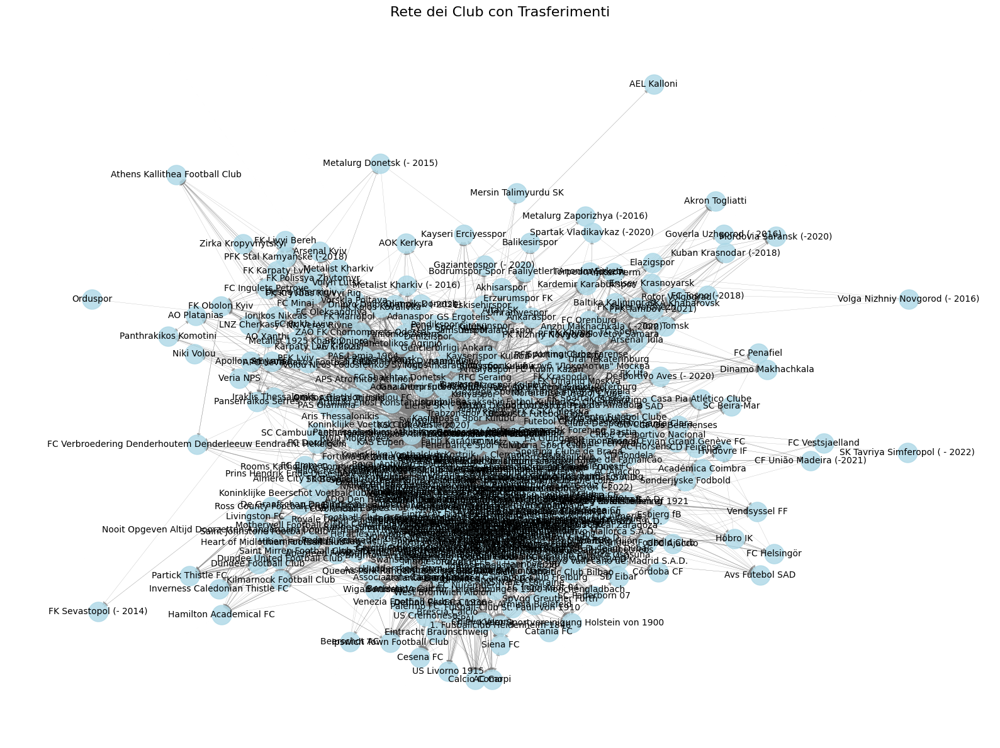


=== Fine della visualizzazione del grafo ===


In [12]:
# ------------------------------------------------------
# 6. VISUALIZZAZIONE DEL GRAFO
# ------------------------------------------------------
print("\n=== 6. Visualizzazione del grafo ===")

# Aumento la dimensione della figura per migliorare la leggibilità
plt.figure(figsize=(16, 12))

# Layout per la disposizione dei nodi
pos = nx.spring_layout(G, seed=42, k=0.5, iterations=200)

# Disegnare i nodi
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue', alpha=0.8)

# Disegnare gli archi (pesati in base al numero di trasferimenti)
edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())
nx.draw_networkx_edges(G, pos, edgelist=edges, width=[w / 5 for w in weights], edge_color='gray', alpha=0.7)

# Disegnare le etichette dei nodi (nomi dei club)
nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')

# Titolo
plt.title("Rete dei Club con Trasferimenti", fontsize=16)
plt.axis('off')  # Nascondi gli assi
plt.tight_layout()  # Ottimizzare la disposizione
plt.show()

print("\n=== Fine della visualizzazione del grafo ===")

In [13]:
calculate_and_print_graph_metrics(G)


=== Metriche del grafo ===
Numero di nodi: 439
Numero di archi: 13183
Densità del grafo: 0.069
Clustering medio: 0.38
Raggio del grafo: None
Diametro del grafo: None
Grado dei nodi: {'Svincolati': 550, 'Verein für Bewegungsspiele Stuttgart 1893': 107, 'FC Bayern München': 97, '1. Fußball- und Sportverein Mainz 05': 103, 'Società Sportiva Lazio S.p.A.': 109, 'US Salernitana 1919': 81, 'APO Levadiakos Football Club': 25, 'Panathinaikos Athlitikos Omilos': 95, 'Inverness Caledonian Thistle FC': 21, 'Dundee United Football Club': 34, 'Sport Lisboa e Benfica': 201, 'Beşiktaş Jimnastik Kulübü': 128, 'Brøndby Idrætsforening': 56, 'FK Rostov': 86, 'Fußball-Club Augsburg 1907': 93, 'Stade brestois 29': 73, 'Associazione Calcio Fiorentina': 133, 'Fenerbahçe Spor Kulübü': 147, 'Associazione Calcio Monza': 52, 'Juventus Football Club': 138, 'Association sportive de Monaco Football Club': 152, 'Galatasaray Spor Kulübü': 160, 'Aalborg Boldspilklub': 42, 'Borussia Verein für Leibesübungen 1900 Mönch


=== 7. Filtraggio dei trasferimenti nel campionato italiano ===

Numero di club italiani: 38
ID dei club italiani: [  12 1025  410  458   46]

Numero di trasferimenti avvenuti tra club italiani: 2082
    player_id transfer_date transfer_season  from_club_id  to_club_id  \
2      626913    2026-06-30           25/26           398         380   
17     301238    2025-07-01           25/26          2919         506   
21     486031    2025-07-01           25/26           430         506   
31      88682    2025-06-30           24/25           749         506   
32      88706    2025-06-30           24/25          1038        8970   

   from_club_name to_club_name  transfer_fee  market_value_in_eur  \
2           Lazio  Salernitana           0.0           15000000.0   
17          Monza     Juventus    14300000.0           18000000.0   
21     Fiorentina     Juventus    28100000.0           35000000.0   
31      FC Empoli     Juventus           0.0            1000000.0   
32      Sampdor

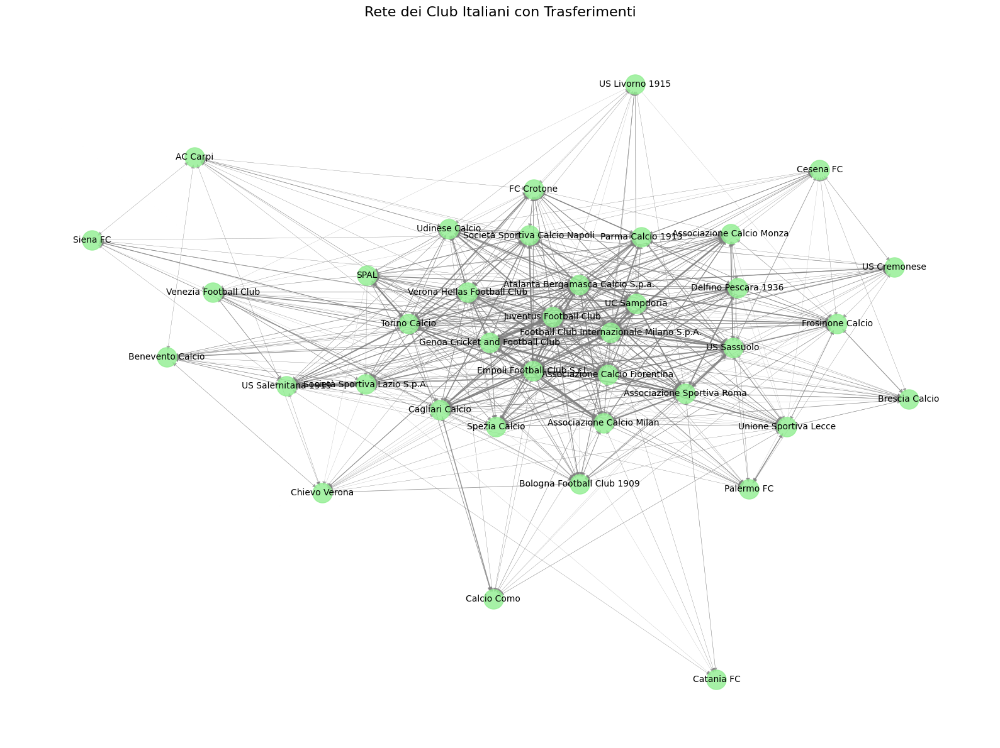


=== Fine della visualizzazione del grafo dei trasferimenti italiani ===

=== Metriche del grafo ===
Numero di nodi: 38
Numero di archi: 784
Densità del grafo: 0.558
Clustering medio: 0.719
Raggio del grafo: 2
Diametro del grafo: 2
Grado dei nodi: {'Società Sportiva Lazio S.p.A.': 46, 'US Salernitana 1919': 46, 'Associazione Calcio Monza': 41, 'Juventus Football Club': 62, 'Associazione Calcio Fiorentina': 54, 'Empoli Football Club S.r.l.': 56, 'UC Sampdoria': 51, 'Frosinone Calcio': 44, 'Calcio Como': 20, 'Genoa Cricket and Football Club': 58, 'Atalanta Bergamasca Calcio S.p.a.': 60, 'Unione Sportiva Lecce': 44, 'Bologna Football Club 1909': 40, 'Verona Hellas Football Club': 55, 'US Sassuolo': 52, 'Associazione Calcio Milan': 55, 'Associazione Sportiva Roma': 46, 'Cagliari Calcio': 44, 'Società Sportiva Calcio Napoli': 49, 'Torino Calcio': 57, 'Spezia Calcio': 40, 'Palermo FC': 28, 'Venezia Football Club': 33, 'Udinese Calcio': 49, 'Football Club Internazionale Milano S.p.A.': 65, 'P

In [14]:
# ------------------------------------------------------
# 7. FILTRARE I CLUB ITALIANI E I TRASFERIMENTI ITALIANI
# ------------------------------------------------------

print("\n=== 7. Filtraggio dei trasferimenti nel campionato italiano ===")

# Filtriamo i club italiani (domestic_competition_id == 'IT1')
italian_clubs = clubs[clubs["domestic_competition_id"] == "IT1"]
italian_club_ids = italian_clubs["club_id"].unique()

print(f"\nNumero di club italiani: {len(italian_clubs)}")
print(f"ID dei club italiani: {italian_club_ids[:5]}")  # Mostriamo i primi 5 club

# Filtriamo i trasferimenti che coinvolgono solo club italiani
italian_transfers = transfers[
    (transfers["from_club_id"].isin(italian_club_ids)) &
    (transfers["to_club_id"].isin(italian_club_ids))
]

print(f"\nNumero di trasferimenti avvenuti tra club italiani: {len(italian_transfers)}")
print(italian_transfers.head())

# ------------------------------------------------------
# 8. CREAZIONE DEL GRAFO CON I TRASFERIMENTI ITALIANI
# ------------------------------------------------------
print("\n=== 8. Creazione del grafo per i trasferimenti italiani ===")

# Creiamo un grafo per i trasferimenti italiani
G_italian = nx.DiGraph()

# Aggiungiamo gli archi per i trasferimenti italiani
for idx, row in italian_transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]
    
    if G_italian.has_edge(from_club, to_club):
        # Incrementa il peso (numero di trasferimenti)
        G_italian[from_club][to_club]["weight"] += 1
        G_italian[from_club][to_club]["cost"] += row.get("transfer_fee", 0)
    else:
        # Aggiungi l'arco con peso 1
        G_italian.add_edge(from_club, to_club, weight=1, cost=row.get("transfer_fee", 0))

print(f"\nNumero di nodi (club italiani) nel grafo: {G_italian.number_of_nodes()}")
print(f"Numero di archi (trasferimenti italiani) nel grafo: {G_italian.number_of_edges()}")

# ------------------------------------------------------
# 9. RILABEL DEI NODI CON I NOMI DEI CLUB ITALIANI
# ------------------------------------------------------
print("\n=== 9. Rilabel dei nodi con i nomi dei club italiani ===")

# Rilabel dei nodi nel grafo con i nomi dei club italiani
nx.relabel_nodes(G_italian, club_id_to_name, copy=False)

# Verifica dei primi 5 nodi (ora dovrebbero esserci i nomi)
print("\nEsempio di nodi con nome (primi 5):")
for i, (key, value) in enumerate(G_italian.nodes(data=True)):
    if i >= 5:
        break
    print(f"{key} -> {value}")

# ------------------------------------------------------
# 10. VISUALIZZAZIONE DEL GRAFO DEI TRASFERIMENTI ITALIANI
# ------------------------------------------------------
print("\n=== 10. Visualizzazione del grafo dei trasferimenti italiani ===")

# Aumento la dimensione della figura per migliorare la leggibilità
plt.figure(figsize=(16, 12))

# Layout per la disposizione dei nodi
pos = nx.spring_layout(G_italian, seed=42, k=0.5, iterations=200)

# Disegnare i nodi
nx.draw_networkx_nodes(G_italian, pos, node_size=500, node_color='lightgreen', alpha=0.8)

# Disegnare gli archi (pesati in base al numero di trasferimenti)
edges, weights = zip(*nx.get_edge_attributes(G_italian, 'weight').items())
nx.draw_networkx_edges(G_italian, pos, edgelist=edges, width=[w / 5 for w in weights], edge_color='gray', alpha=0.7)

# Disegnare le etichette dei nodi (nomi dei club italiani)
nx.draw_networkx_labels(G_italian, pos, font_size=10, font_color='black')

# Titolo
plt.title("Rete dei Club Italiani con Trasferimenti", fontsize=16)
plt.axis('off')  # Nascondi gli assi
plt.tight_layout()  # Ottimizzare la disposizione
plt.show()

print("\n=== Fine della visualizzazione del grafo dei trasferimenti italiani ===")

calculate_and_print_graph_metrics(G_italian)

In [15]:
# ------------------------------------------------------
# 7 FILTRARE I TRASFERIMENTI TRA CLUB ITALIANI E SVINCOLATI
# ------------------------------------------------------

print("\n=== 7 Filtraggio dei trasferimenti tra club italiani e Svincolati ===")

# Filtriamo i club italiani (domestic_competition_id == 'IT1')
italian_clubs = clubs[clubs["domestic_competition_id"] == "IT1"]
italian_club_ids = italian_clubs["club_id"].unique()

print(f"\nNumero di club italiani: {len(italian_clubs)}")
print(f"ID dei club italiani: {italian_club_ids[:5]}")  # Mostriamo i primi 5 club

# Filtriamo i trasferimenti che coinvolgono:
# - trasferimenti tra club italiani
# - trasferimenti tra un club italiano e "Svincolati" (515)
italian_svincolati_transfers = transfers[
    ((transfers["from_club_id"].isin(italian_club_ids)) & (transfers["to_club_id"] == 515)) | 
    ((transfers["to_club_id"].isin(italian_club_ids)) & (transfers["from_club_id"] == 515)) |
    ((transfers["from_club_id"].isin(italian_club_ids)) & (transfers["to_club_id"].isin(italian_club_ids)))
]

print(f"\nNumero di trasferimenti che coinvolgono club italiani e svincolati: {len(italian_svincolati_transfers)}")
print(italian_svincolati_transfers.head())


=== 7 Filtraggio dei trasferimenti tra club italiani e Svincolati ===

Numero di club italiani: 38
ID dei club italiani: [  12 1025  410  458   46]

Numero di trasferimenti che coinvolgono club italiani e svincolati: 2162
    player_id transfer_date transfer_season  from_club_id  to_club_id  \
2      626913    2026-06-30           25/26           398         380   
17     301238    2025-07-01           25/26          2919         506   
21     486031    2025-07-01           25/26           430         506   
31      88682    2025-06-30           24/25           749         506   
32      88706    2025-06-30           24/25          1038        8970   

   from_club_name to_club_name  transfer_fee  market_value_in_eur  \
2           Lazio  Salernitana           0.0           15000000.0   
17          Monza     Juventus    14300000.0           18000000.0   
21     Fiorentina     Juventus    28100000.0           35000000.0   
31      FC Empoli     Juventus           0.0            100000

In [16]:
# ------------------------------------------------------
# 8. CREAZIONE DEL GRAFO CON I TRASFERIMENTI ITALIANI E SVINCOLATI
# ------------------------------------------------------

print("\n=== 8. Creazione del grafo per i trasferimenti italiani e svincolati ===")

# Creiamo un grafo per i trasferimenti italiani e svincolati
G_italian_svincolati = nx.DiGraph()

# Aggiungiamo gli archi per i trasferimenti italiani e svincolati
for idx, row in italian_svincolati_transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]
    
    # Se il club di origine o destinazione è 515 (svincolati), lo sostituiamo con "Svincolati"
    if from_club == 515:
        from_club = "Svincolati"
    if to_club == 515:
        to_club = "Svincolati"

    if G_italian_svincolati.has_edge(from_club, to_club):
        # Incrementa il peso (numero di trasferimenti)
        G_italian_svincolati[from_club][to_club]["weight"] += 1
        G_italian_svincolati[from_club][to_club]["cost"] += row.get("transfer_fee", 0)
    else:
        # Aggiungi l'arco con peso 1
        G_italian_svincolati.add_edge(from_club, to_club, weight=1, cost=row.get("transfer_fee", 0))

print(f"\nNumero di nodi (club italiani e svincolati) nel grafo: {G_italian_svincolati.number_of_nodes()}")
print(f"Numero di archi (trasferimenti italiani e svincolati) nel grafo: {G_italian_svincolati.number_of_edges()}")


=== 8. Creazione del grafo per i trasferimenti italiani e svincolati ===

Numero di nodi (club italiani e svincolati) nel grafo: 39
Numero di archi (trasferimenti italiani e svincolati) nel grafo: 823


In [17]:
# ------------------------------------------------------
# 9. RILABEL DEI NODI CON I NOMI DEI CLUB ITALIANI
# ------------------------------------------------------

print("\n=== 9. Rilabel dei nodi con i nomi dei club italiani e svincolati ===")

# Rilabel dei nodi nel grafo con i nomi dei club italiani (compreso "Svincolati")
nx.relabel_nodes(G_italian_svincolati, club_id_to_name, copy=False)

# Verifica dei primi 5 nodi (ora dovrebbero esserci i nomi)
print("\nEsempio di nodi con nome (primi 5):")
for i, (key, value) in enumerate(G_italian_svincolati.nodes(data=True)):
    if i >= 5:
        break
    print(f"{key} -> {value}")


=== 9. Rilabel dei nodi con i nomi dei club italiani e svincolati ===

Esempio di nodi con nome (primi 5):
Svincolati -> {}
Società Sportiva Lazio S.p.A. -> {}
US Salernitana 1919 -> {}
Associazione Calcio Monza -> {}
Juventus Football Club -> {}



=== 10. Visualizzazione del grafo dei trasferimenti italiani e svincolati ===


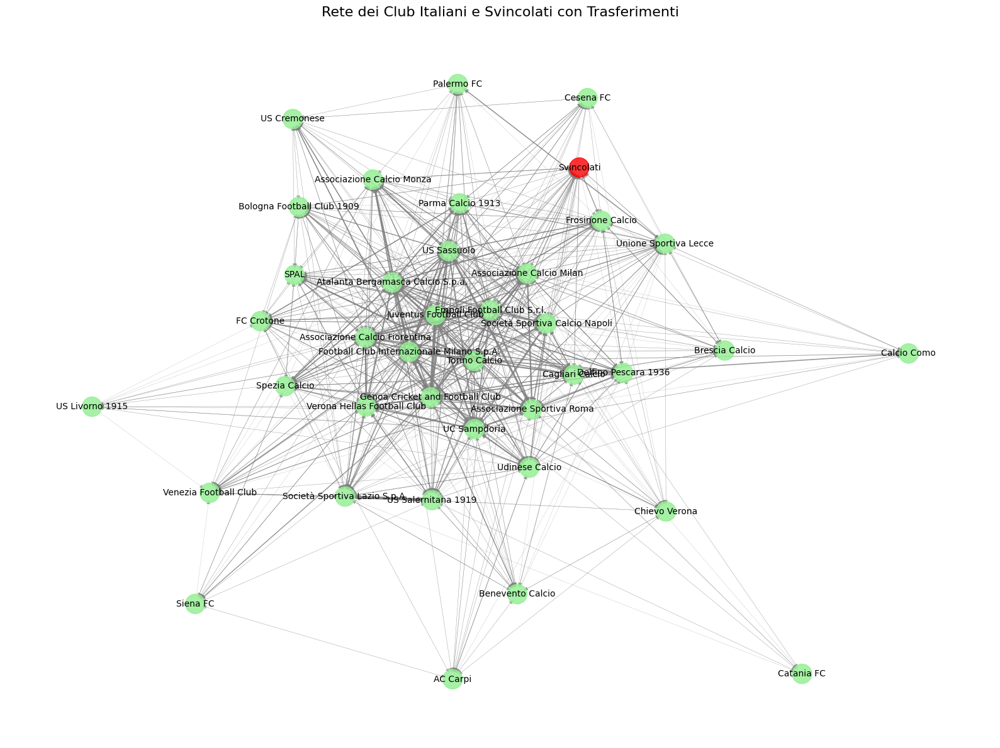


=== Fine della visualizzazione del grafo dei trasferimenti italiani e svincolati ===

=== Metriche del grafo ===
Numero di nodi: 39
Numero di archi: 823
Densità del grafo: 0.555
Clustering medio: 0.725
Raggio del grafo: 2
Diametro del grafo: 2
Grado dei nodi: {'Svincolati': 39, 'Società Sportiva Lazio S.p.A.': 47, 'US Salernitana 1919': 48, 'Associazione Calcio Monza': 43, 'Juventus Football Club': 63, 'Associazione Calcio Fiorentina': 56, 'Empoli Football Club S.r.l.': 57, 'UC Sampdoria': 53, 'Frosinone Calcio': 46, 'Calcio Como': 20, 'Genoa Cricket and Football Club': 60, 'Atalanta Bergamasca Calcio S.p.a.': 60, 'Unione Sportiva Lecce': 46, 'Bologna Football Club 1909': 42, 'Verona Hellas Football Club': 57, 'US Sassuolo': 53, 'Associazione Calcio Milan': 57, 'Associazione Sportiva Roma': 48, 'Cagliari Calcio': 46, 'Società Sportiva Calcio Napoli': 50, 'Torino Calcio': 58, 'Spezia Calcio': 41, 'Palermo FC': 28, 'Venezia Football Club': 33, 'Udinese Calcio': 51, 'Football Club Intern

In [18]:
# ------------------------------------------------------
# 10. VISUALIZZAZIONE DEL GRAFO DEI TRASFERIMENTI ITALIANI E SVINCOLATI
# ------------------------------------------------------

print("\n=== 10. Visualizzazione del grafo dei trasferimenti italiani e svincolati ===")

# Aumento la dimensione della figura per migliorare la leggibilità
plt.figure(figsize=(16, 12))

# Layout per la disposizione dei nodi
pos = nx.spring_layout(G_italian_svincolati, seed=42, k=0.5, iterations=200)

node_colors = ['lightgreen' if node != "Svincolati" else 'red' for node in G_italian_svincolati.nodes()]
# Disegnare i nodi
nx.draw_networkx_nodes(G_italian_svincolati, pos, node_size=500, node_color=node_colors, alpha=0.8)

# Disegnare gli archi (pesati in base al numero di trasferimenti)
edges, weights = zip(*nx.get_edge_attributes(G_italian_svincolati, 'weight').items())
nx.draw_networkx_edges(G_italian_svincolati, pos, edgelist=edges, width=[w / 5 for w in weights], edge_color='gray', alpha=0.7)

# Disegnare le etichette dei nodi (nomi dei club italiani e svincolati)
nx.draw_networkx_labels(G_italian_svincolati, pos, font_size=10, font_color='black')

# Titolo
plt.title("Rete dei Club Italiani e Svincolati con Trasferimenti", fontsize=16)
plt.axis('off')  # Nascondi gli assi
plt.tight_layout()  # Ottimizzare la disposizione
plt.show()

print("\n=== Fine della visualizzazione del grafo dei trasferimenti italiani e svincolati ===")

calculate_and_print_graph_metrics(G_italian_svincolati)

In [19]:
# ------------------------------------------------------
# 7. FILTRARE I CLUB INGLESI E I TRASFERIMENTI INGLESI
# ------------------------------------------------------

print("\n=== 7. Filtraggio dei trasferimenti nel campionato inglese ===")

# Filtriamo i club inglesi (domestic_competition_id == 'GB1')
english_clubs = clubs[clubs["domestic_competition_id"] == "GB1"]
english_club_ids = english_clubs["club_id"].unique()

print(f"\nNumero di club inglesi: {len(english_clubs)}")
print(f"ID dei club inglesi: {english_club_ids[:5]}")  # Mostriamo i primi 5 club

# Filtriamo i trasferimenti che coinvolgono solo club inglesi
english_transfers = transfers[
    (transfers["from_club_id"].isin(english_club_ids)) &
    (transfers["to_club_id"].isin(english_club_ids))
]

print(f"\nNumero di trasferimenti avvenuti tra club inglesi: {len(english_transfers)}")
print(english_transfers.head())


=== 7. Filtraggio dei trasferimenti nel campionato inglese ===

Numero di club inglesi: 37
ID dei club inglesi: [ 148  603  989 3008   31]

Numero di trasferimenti avvenuti tra club inglesi: 1244
     player_id transfer_date transfer_season  from_club_id  to_club_id  \
33      111819    2025-06-30           24/25            11         989   
50      181579    2025-06-30           24/25           703         379   
65      234781    2025-06-30           24/25           180         379   
119     340325    2025-06-30           24/25           931          11   
124     344152    2025-06-30           24/25          1003         873   

    from_club_name    to_club_name  transfer_fee  market_value_in_eur  \
33         Arsenal     Bournemouth           0.0            2000000.0   
50    Nottm Forest        West Ham           0.0           16000000.0   
65     Southampton        West Ham           0.0            8000000.0   
119         Fulham         Arsenal           0.0           1800000

In [20]:
# ------------------------------------------------------
# 8. CREAZIONE DEL GRAFO CON I TRASFERIMENTI INGLESI
# ------------------------------------------------------
print("\n=== 8. Creazione del grafo per i trasferimenti inglesi ===")

# Creiamo un grafo per i trasferimenti inglesi
G_english = nx.DiGraph()

# Aggiungiamo gli archi per i trasferimenti inglesi
for idx, row in english_transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]
    
    if G_english.has_edge(from_club, to_club):
        # Incrementa il peso (numero di trasferimenti)
        G_english[from_club][to_club]["weight"] += 1
        G_english[from_club][to_club]["cost"] += row.get("transfer_fee", 0)
    else:
        # Aggiungi l'arco con peso 1
        G_english.add_edge(from_club, to_club, weight=1, cost=row.get("transfer_fee", 0))

print(f"\nNumero di nodi (club inglesi) nel grafo: {G_english.number_of_nodes()}")
print(f"Numero di archi (trasferimenti inglesi) nel grafo: {G_english.number_of_edges()}")


=== 8. Creazione del grafo per i trasferimenti inglesi ===

Numero di nodi (club inglesi) nel grafo: 37
Numero di archi (trasferimenti inglesi) nel grafo: 701


In [21]:
# ------------------------------------------------------
# 9. RILABEL DEI NODI CON I NOMI DEI CLUB INGLESI
# ------------------------------------------------------
print("\n=== 9. Rilabel dei nodi con i nomi dei club inglesi ===")

# Rilabel dei nodi nel grafo con i nomi dei club inglesi
nx.relabel_nodes(G_english, club_id_to_name, copy=False)

# Verifica dei primi 5 nodi (ora dovrebbero esserci i nomi)
print("\nEsempio di nodi con nome (primi 5):")
for i, (key, value) in enumerate(G_english.nodes(data=True)):
    if i >= 5:
        break
    print(f"{key} -> {value}")


=== 9. Rilabel dei nodi con i nomi dei club inglesi ===

Esempio di nodi con nome (primi 5):
Arsenal Football Club -> {}
Association Football Club Bournemouth -> {}
Nottingham Forest Football Club -> {}
West Ham United Football Club -> {}
Southampton Football Club -> {}



=== 10. Visualizzazione del grafo dei trasferimenti inglesi ===


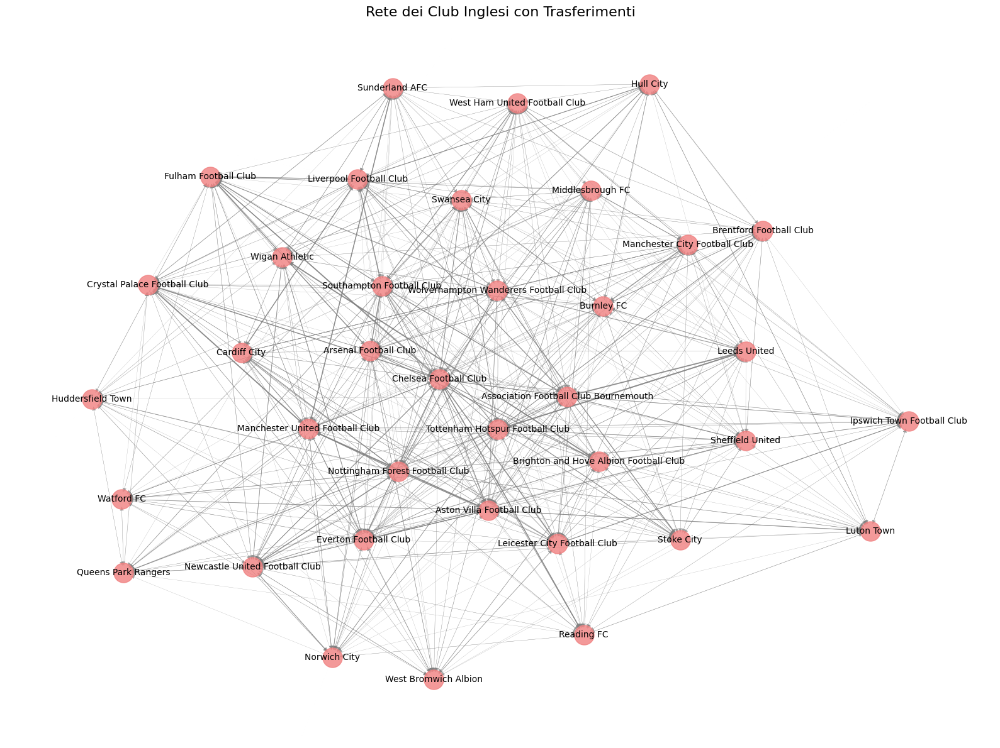


=== Fine della visualizzazione del grafo dei trasferimenti inglesi ===

=== Metriche del grafo ===
Numero di nodi: 37
Numero di archi: 701
Densità del grafo: 0.526
Clustering medio: 0.651
Raggio del grafo: 2
Diametro del grafo: 2
Grado dei nodi: {'Arsenal Football Club': 50, 'Association Football Club Bournemouth': 42, 'Nottingham Forest Football Club': 41, 'West Ham United Football Club': 43, 'Southampton Football Club': 41, 'Fulham Football Club': 39, 'Leicester City Football Club': 49, 'Crystal Palace Football Club': 37, 'Ipswich Town Football Club': 29, 'Manchester City Football Club': 38, 'Chelsea Football Club': 54, 'Manchester United Football Club': 46, 'Everton Football Club': 47, 'Leeds United': 32, 'Brighton and Hove Albion Football Club': 39, 'Aston Villa Football Club': 49, 'Wigan Athletic': 34, 'Liverpool Football Club': 42, 'Wolverhampton Wanderers Football Club': 46, 'Newcastle United Football Club': 43, 'Luton Town': 29, 'Burnley FC': 33, 'Sunderland AFC': 30, 'Queens 

In [22]:
# ------------------------------------------------------
# 10. VISUALIZZAZIONE DEL GRAFO DEI TRASFERIMENTI INGLESI
# ------------------------------------------------------
print("\n=== 10. Visualizzazione del grafo dei trasferimenti inglesi ===")

# Aumento la dimensione della figura per migliorare la leggibilità
plt.figure(figsize=(16, 12))

# Layout per la disposizione dei nodi
pos = nx.spring_layout(G_english, seed=42, k=0.5, iterations=200)

# Disegnare i nodi
nx.draw_networkx_nodes(G_english, pos, node_size=500, node_color='lightcoral', alpha=0.8)

# Disegnare gli archi (pesati in base al numero di trasferimenti)
edges, weights = zip(*nx.get_edge_attributes(G_english, 'weight').items())
nx.draw_networkx_edges(G_english, pos, edgelist=edges, width=[w / 5 for w in weights], edge_color='gray', alpha=0.7)

# Disegnare le etichette dei nodi (nomi dei club inglesi)
nx.draw_networkx_labels(G_english, pos, font_size=10, font_color='black')

# Titolo
plt.title("Rete dei Club Inglesi con Trasferimenti", fontsize=16)
plt.axis('off')  # Nascondi gli assi
plt.tight_layout()  # Ottimizzare la disposizione
plt.show()

print("\n=== Fine della visualizzazione del grafo dei trasferimenti inglesi ===")

calculate_and_print_graph_metrics(G_english)


=== 7 Filtraggio dei trasferimenti tra club inglesi e Svincolati ===

Numero di club inglesi: 37
ID dei club inglesi: [ 148  603  989 3008   31]

Numero di trasferimenti che coinvolgono club inglesi e svincolati: 1336
     player_id transfer_date transfer_season  from_club_id  to_club_id  \
33      111819    2025-06-30           24/25            11         989   
50      181579    2025-06-30           24/25           703         379   
65      234781    2025-06-30           24/25           180         379   
119     340325    2025-06-30           24/25           931          11   
124     344152    2025-06-30           24/25          1003         873   

    from_club_name    to_club_name  transfer_fee  market_value_in_eur  \
33         Arsenal     Bournemouth           0.0            2000000.0   
50    Nottm Forest        West Ham           0.0           16000000.0   
65     Southampton        West Ham           0.0            8000000.0   
119         Fulham         Arsenal          

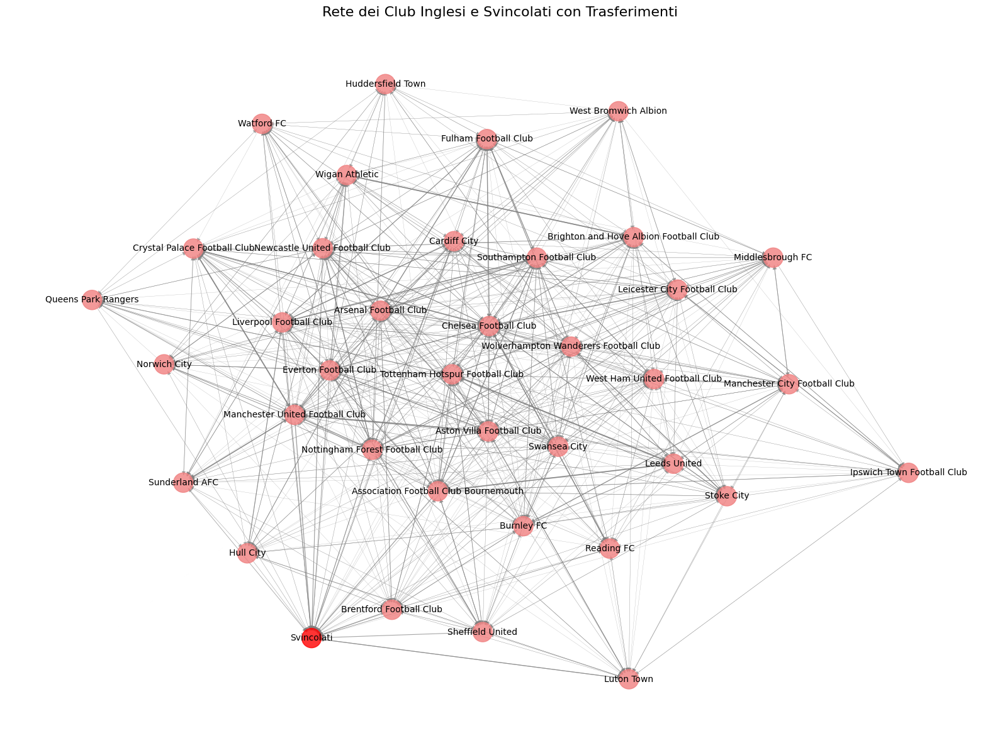


=== Fine della visualizzazione del grafo dei trasferimenti inglesi e svincolati ===

=== Metriche del grafo ===
Numero di nodi: 38
Numero di archi: 746
Densità del grafo: 0.531
Clustering medio: 0.672
Raggio del grafo: 2
Diametro del grafo: 2
Grado dei nodi: {'Svincolati': 45, 'Arsenal Football Club': 51, 'Association Football Club Bournemouth': 43, 'Nottingham Forest Football Club': 43, 'West Ham United Football Club': 44, 'Southampton Football Club': 42, 'Fulham Football Club': 40, 'Leicester City Football Club': 50, 'Crystal Palace Football Club': 38, 'Ipswich Town Football Club': 30, 'Manchester City Football Club': 38, 'Chelsea Football Club': 55, 'Manchester United Football Club': 47, 'Everton Football Club': 48, 'Leeds United': 33, 'Brighton and Hove Albion Football Club': 40, 'Aston Villa Football Club': 50, 'Wigan Athletic': 36, 'Liverpool Football Club': 43, 'Wolverhampton Wanderers Football Club': 47, 'Newcastle United Football Club': 45, 'Luton Town': 31, 'Burnley FC': 34,

In [23]:
# ------------------------------------------------------
# 7 FILTRARE I TRASFERIMENTI TRA CLUB INGLESI E SVINCOLATI
# ------------------------------------------------------

print("\n=== 7 Filtraggio dei trasferimenti tra club inglesi e Svincolati ===")

# Filtriamo i club inglesi (domestic_competition_id == 'GB1')
english_clubs = clubs[clubs["domestic_competition_id"] == "GB1"]
english_club_ids = english_clubs["club_id"].unique()

print(f"\nNumero di club inglesi: {len(english_clubs)}")
print(f"ID dei club inglesi: {english_club_ids[:5]}")  # Mostriamo i primi 5 club

# Filtriamo i trasferimenti che coinvolgono:
# - trasferimenti tra club inglesi
# - trasferimenti tra un club inglese e "Svincolati" (515)
english_svincolati_transfers = transfers[
    ((transfers["from_club_id"].isin(english_club_ids)) & (transfers["to_club_id"] == 515)) | 
    ((transfers["to_club_id"].isin(english_club_ids)) & (transfers["from_club_id"] == 515)) |
    ((transfers["from_club_id"].isin(english_club_ids)) & (transfers["to_club_id"].isin(english_club_ids)))
]

print(f"\nNumero di trasferimenti che coinvolgono club inglesi e svincolati: {len(english_svincolati_transfers)}")
print(english_svincolati_transfers.head())

# ------------------------------------------------------
# 8. CREAZIONE DEL GRAFO CON I TRASFERIMENTI INGLESI E SVINCOLATI
# ------------------------------------------------------

print("\n=== 8. Creazione del grafo per i trasferimenti inglesi e svincolati ===")

# Creiamo un grafo per i trasferimenti inglesi e svincolati
G_english_svincolati = nx.DiGraph()

# Aggiungiamo gli archi per i trasferimenti inglesi e svincolati
for idx, row in english_svincolati_transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]
    
    # Se il club di origine o destinazione è 515 (svincolati), lo sostituiamo con "Svincolati"
    if from_club == 515:
        from_club = "Svincolati"
    if to_club == 515:
        to_club = "Svincolati"

    if G_english_svincolati.has_edge(from_club, to_club):
        # Incrementa il peso (numero di trasferimenti)
        G_english_svincolati[from_club][to_club]["weight"] += 1
        G_english_svincolati[from_club][to_club]["cost"] += row.get("transfer_fee", 0)
    else:
        # Aggiungi l'arco con peso 1
        G_english_svincolati.add_edge(from_club, to_club, weight=1, cost=row.get("transfer_fee", 0))

print(f"\nNumero di nodi (club inglesi e svincolati) nel grafo: {G_english_svincolati.number_of_nodes()}")
print(f"Numero di archi (trasferimenti inglesi e svincolati) nel grafo: {G_english_svincolati.number_of_edges()}")

# ------------------------------------------------------
# 9. RILABEL DEI NODI CON I NOMI DEI CLUB INGLESI
# ------------------------------------------------------

print("\n=== 9. Rilabel dei nodi con i nomi dei club inglesi e svincolati ===")

# Rilabel dei nodi nel grafo con i nomi dei club inglesi (compreso "Svincolati")
nx.relabel_nodes(G_english_svincolati, club_id_to_name, copy=False)

# Verifica dei primi 5 nodi (ora dovrebbero esserci i nomi)
print("\nEsempio di nodi con nome (primi 5):")
for i, (key, value) in enumerate(G_english_svincolati.nodes(data=True)):
    if i >= 5:
        break
    print(f"{key} -> {value}")

# ------------------------------------------------------
# 10. VISUALIZZAZIONE DEL GRAFO DEI TRASFERIMENTI INGLESI E SVINCOLATI
# ------------------------------------------------------

print("\n=== 10. Visualizzazione del grafo dei trasferimenti inglesi e svincolati ===")

# Aumento la dimensione della figura per migliorare la leggibilità
plt.figure(figsize=(16, 12))

# Layout per la disposizione dei nodi
pos = nx.spring_layout(G_english_svincolati, seed=42, k=0.5, iterations=200)

# Disegnare i nodi, evidenziando il nodo "Svincolati"
# Nodo "Svincolati" in un colore specifico
node_colors = ['lightcoral' if node != "Svincolati" else 'red' for node in G_english_svincolati.nodes()]

# Disegnare i nodi
nx.draw_networkx_nodes(G_english_svincolati, pos, node_size=500, node_color=node_colors, alpha=0.8)

# Disegnare gli archi (pesati in base al numero di trasferimenti)
edges, weights = zip(*nx.get_edge_attributes(G_english_svincolati, 'weight').items())
nx.draw_networkx_edges(G_english_svincolati, pos, edgelist=edges, width=[w / 5 for w in weights], edge_color='gray', alpha=0.7)

# Disegnare le etichette dei nodi (nomi dei club inglesi e svincolati)
nx.draw_networkx_labels(G_english_svincolati, pos, font_size=10, font_color='black')

# Titolo
plt.title("Rete dei Club Inglesi e Svincolati con Trasferimenti", fontsize=16)
plt.axis('off')  # Nascondi gli assi
plt.tight_layout()  # Ottimizzare la disposizione
plt.show()

print("\n=== Fine della visualizzazione del grafo dei trasferimenti inglesi e svincolati ===")

calculate_and_print_graph_metrics(G_english_svincolati)

In [24]:
# ------------------------------------------------------
# 7. FILTRARE I CLUB SPAGNOLI E I TRASFERIMENTI SPAGNOLI
# ------------------------------------------------------

print("\n=== 7. Filtraggio dei trasferimenti nel campionato spagnolo ===")

# Filtriamo i club spagnoli (domestic_competition_id == 'ES1')
spanish_clubs = clubs[clubs["domestic_competition_id"] == "ES1"]
spanish_club_ids = spanish_clubs["club_id"].unique()

print(f"\nNumero di club spagnoli: {len(spanish_clubs)}")
print(f"ID dei club spagnoli: {spanish_club_ids[:5]}")  # Mostriamo i primi 5 club

# Filtriamo i trasferimenti che coinvolgono solo club spagnoli
spanish_transfers = transfers[
    (transfers["from_club_id"].isin(spanish_club_ids)) &
    (transfers["to_club_id"].isin(spanish_club_ids))
]

print(f"\nNumero di trasferimenti avvenuti tra club spagnoli: {len(spanish_transfers)}")
print(spanish_transfers.head())


=== 7. Filtraggio dei trasferimenti nel campionato spagnolo ===

Numero di club spagnoli: 32
ID dei club spagnoli: [5358  993 1108   13  131]

Numero di trasferimenti avvenuti tra club spagnoli: 1070
    player_id transfer_date transfer_season  from_club_id  to_club_id  \
28      66100    2025-06-30           24/25         12321         131   
39     148928    2025-06-30           24/25           368          13   
47     177847    2025-06-30           24/25           472         368   
51     182904    2025-06-30           24/25            13         131   
79     263727    2025-06-30           24/25          1108         368   

     from_club_name     to_club_name  transfer_fee  market_value_in_eur  \
28           Girona        Barcelona           0.0            2000000.0   
39       Sevilla FC  Atlético Madrid           0.0            5000000.0   
47    UD Las Palmas       Sevilla FC           0.0            2000000.0   
51  Atlético Madrid        Barcelona           0.0          

In [25]:
# ------------------------------------------------------
# 8. CREAZIONE DEL GRAFO CON I TRASFERIMENTI SPAGNOLI
# ------------------------------------------------------
print("\n=== 8. Creazione del grafo per i trasferimenti spagnoli ===")

# Creiamo un grafo per i trasferimenti spagnoli
G_spanish = nx.DiGraph()

# Aggiungiamo gli archi per i trasferimenti spagnoli
for idx, row in spanish_transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]
    
    if G_spanish.has_edge(from_club, to_club):
        # Incrementa il peso (numero di trasferimenti)
        G_spanish[from_club][to_club]["weight"] += 1
        G_spanish[from_club][to_club]["cost"] += row.get("transfer_fee", 0)
    else:
        # Aggiungi l'arco con peso 1
        G_spanish.add_edge(from_club, to_club, weight=1, cost=row.get("transfer_fee", 0))

print(f"\nNumero di nodi (club spagnoli) nel grafo: {G_spanish.number_of_nodes()}")
print(f"Numero di archi (trasferimenti spagnoli) nel grafo: {G_spanish.number_of_edges()}")



=== 8. Creazione del grafo per i trasferimenti spagnoli ===

Numero di nodi (club spagnoli) nel grafo: 32
Numero di archi (trasferimenti spagnoli) nel grafo: 519



=== 9. Rilabel dei nodi con i nomi dei club spagnoli ===

Esempio di nodi con nome (primi 5):
Girona Fútbol Club S. A. D. -> {}
Futbol Club Barcelona -> {}
Sevilla Fútbol Club S.A.D. -> {}
Club Atlético de Madrid S.A.D. -> {}
Unión Deportiva Las Palmas S.A.D. -> {}

=== 10. Visualizzazione del grafo dei trasferimenti spagnoli ===


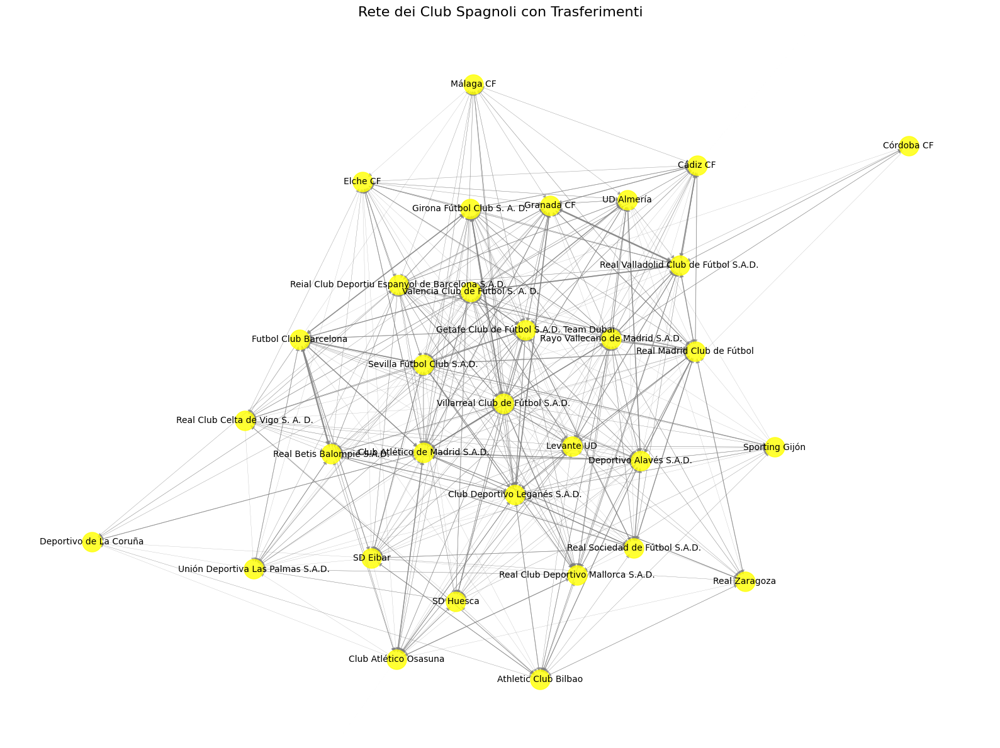


=== Fine della visualizzazione del grafo dei trasferimenti spagnoli ===

=== Metriche del grafo ===
Numero di nodi: 32
Numero di archi: 519
Densità del grafo: 0.523
Clustering medio: 0.668
Raggio del grafo: 2
Diametro del grafo: 3
Grado dei nodi: {'Girona Fútbol Club S. A. D.': 40, 'Futbol Club Barcelona': 31, 'Sevilla Fútbol Club S.A.D.': 42, 'Club Atlético de Madrid S.A.D.': 46, 'Unión Deportiva Las Palmas S.A.D.': 27, 'Deportivo Alavés S.A.D.': 41, 'Rayo Vallecano de Madrid S.A.D.': 41, 'Granada CF': 35, 'Real Club Celta de Vigo S. A. D.': 30, 'Real Betis Balompié S.A.D.': 30, 'Getafe Club de Fútbol S.A.D. Team Dubai': 42, 'UD Almería': 31, 'Real Valladolid Club de Fútbol S.A.D.': 30, 'Valencia Club de Fútbol S. A. D.': 37, 'Real Club Deportivo Mallorca S.A.D.': 34, 'Athletic Club Bilbao': 28, 'Villarreal Club de Fútbol S.A.D.': 44, 'Levante UD': 39, 'Club Deportivo Leganés S.A.D.': 41, 'SD Eibar': 32, 'Reial Club Deportiu Espanyol de Barcelona S.A.D.': 44, 'Real Madrid Club de Fút

In [26]:
# ------------------------------------------------------
# 9. RILABEL DEI NODI CON I NOMI DEI CLUB SPAGNOLI
# ------------------------------------------------------
print("\n=== 9. Rilabel dei nodi con i nomi dei club spagnoli ===")

# Rilabel dei nodi nel grafo con i nomi dei club spagnoli
nx.relabel_nodes(G_spanish, club_id_to_name, copy=False)

# Verifica dei primi 5 nodi (ora dovrebbero esserci i nomi)
print("\nEsempio di nodi con nome (primi 5):")
for i, (key, value) in enumerate(G_spanish.nodes(data=True)):
    if i >= 5:
        break
    print(f"{key} -> {value}")

# ------------------------------------------------------
# 10. VISUALIZZAZIONE DEL GRAFO DEI TRASFERIMENTI SPAGNOLI
# ------------------------------------------------------
print("\n=== 10. Visualizzazione del grafo dei trasferimenti spagnoli ===")

# Aumento la dimensione della figura per migliorare la leggibilità
plt.figure(figsize=(16, 12))

# Layout per la disposizione dei nodi
pos = nx.spring_layout(G_spanish, seed=42, k=0.5, iterations=200)

# Disegnare i nodi
nx.draw_networkx_nodes(G_spanish, pos, node_size=500, node_color='yellow', alpha=0.8)

# Disegnare gli archi (pesati in base al numero di trasferimenti)
edges, weights = zip(*nx.get_edge_attributes(G_spanish, 'weight').items())
nx.draw_networkx_edges(G_spanish, pos, edgelist=edges, width=[w / 5 for w in weights], edge_color='gray', alpha=0.7)

# Disegnare le etichette dei nodi (nomi dei club spagnoli)
nx.draw_networkx_labels(G_spanish, pos, font_size=10, font_color='black')

# Titolo
plt.title("Rete dei Club Spagnoli con Trasferimenti", fontsize=16)
plt.axis('off')  # Nascondi gli assi
plt.tight_layout()  # Ottimizzare la disposizione
plt.show()

print("\n=== Fine della visualizzazione del grafo dei trasferimenti spagnoli ===")

calculate_and_print_graph_metrics(G_spanish)


=== 7 Filtraggio dei trasferimenti tra club spagnoli e Svincolati ===

Numero di club spagnoli: 32
ID dei club spagnoli: [5358  993 1108   13  131]

Numero di trasferimenti che coinvolgono club spagnoli e svincolati: 1123
    player_id transfer_date transfer_season  from_club_id  to_club_id  \
28      66100    2025-06-30           24/25         12321         131   
39     148928    2025-06-30           24/25           368          13   
47     177847    2025-06-30           24/25           472         368   
51     182904    2025-06-30           24/25            13         131   
79     263727    2025-06-30           24/25          1108         368   

     from_club_name     to_club_name  transfer_fee  market_value_in_eur  \
28           Girona        Barcelona           0.0            2000000.0   
39       Sevilla FC  Atlético Madrid           0.0            5000000.0   
47    UD Las Palmas       Sevilla FC           0.0            2000000.0   
51  Atlético Madrid        Barcelona  

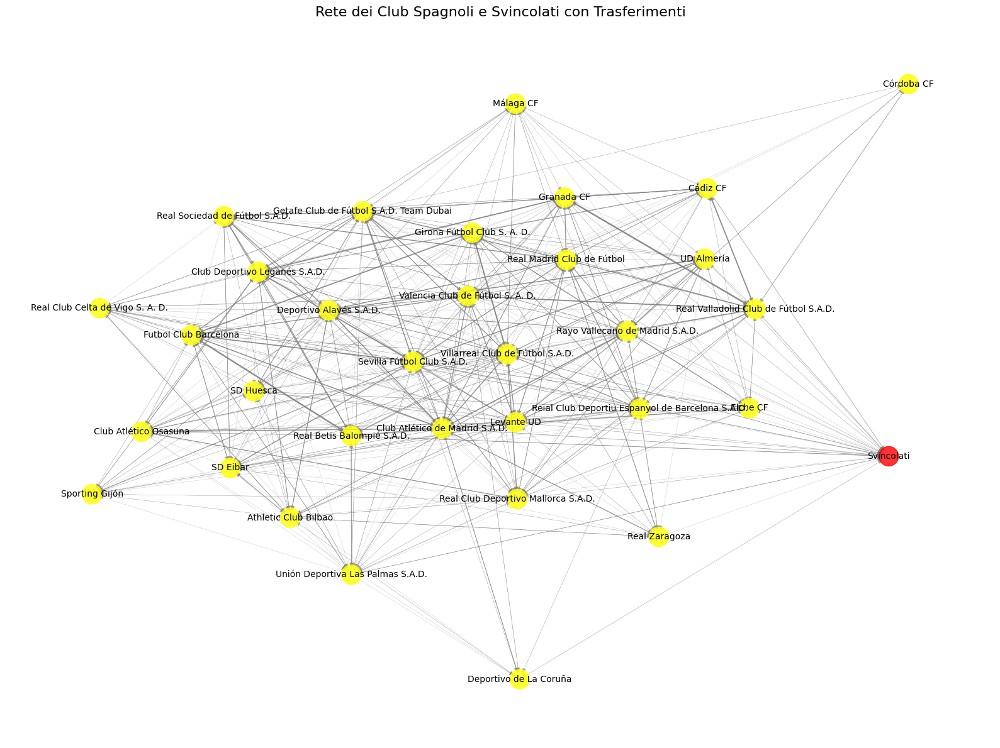


=== Fine della visualizzazione del grafo dei trasferimenti spagnoli e svincolati ===

=== Metriche del grafo ===
Numero di nodi: 33
Numero di archi: 552
Densità del grafo: 0.523
Clustering medio: 0.675
Raggio del grafo: 2
Diametro del grafo: 3
Grado dei nodi: {'Svincolati': 33, 'Girona Fútbol Club S. A. D.': 42, 'Futbol Club Barcelona': 31, 'Sevilla Fútbol Club S.A.D.': 43, 'Club Atlético de Madrid S.A.D.': 47, 'Unión Deportiva Las Palmas S.A.D.': 29, 'Deportivo Alavés S.A.D.': 41, 'Rayo Vallecano de Madrid S.A.D.': 43, 'Granada CF': 36, 'Real Club Celta de Vigo S. A. D.': 30, 'Real Betis Balompié S.A.D.': 32, 'Getafe Club de Fútbol S.A.D. Team Dubai': 43, 'UD Almería': 33, 'Real Valladolid Club de Fútbol S.A.D.': 32, 'Valencia Club de Fútbol S. A. D.': 38, 'Real Club Deportivo Mallorca S.A.D.': 35, 'Athletic Club Bilbao': 29, 'Villarreal Club de Fútbol S.A.D.': 46, 'Levante UD': 40, 'Club Deportivo Leganés S.A.D.': 42, 'SD Eibar': 32, 'Reial Club Deportiu Espanyol de Barcelona S.A.D.

In [27]:
# ------------------------------------------------------
# 7 FILTRARE I TRASFERIMENTI TRA CLUB SPAGNOLI E SVINCOLATI
# ------------------------------------------------------

print("\n=== 7 Filtraggio dei trasferimenti tra club spagnoli e Svincolati ===")

# Filtriamo i club spagnoli (domestic_competition_id == 'ES1')
spanish_clubs = clubs[clubs["domestic_competition_id"] == "ES1"]
spanish_club_ids = spanish_clubs["club_id"].unique()

print(f"\nNumero di club spagnoli: {len(spanish_clubs)}")
print(f"ID dei club spagnoli: {spanish_club_ids[:5]}")  # Mostriamo i primi 5 club

# Filtriamo i trasferimenti che coinvolgono:
# - trasferimenti tra club spagnoli
# - trasferimenti tra un club spagnolo e "Svincolati" (515)
spanish_svincolati_transfers = transfers[
    ((transfers["from_club_id"].isin(spanish_club_ids)) & (transfers["to_club_id"] == 515)) | 
    ((transfers["to_club_id"].isin(spanish_club_ids)) & (transfers["from_club_id"] == 515)) |
    ((transfers["from_club_id"].isin(spanish_club_ids)) & (transfers["to_club_id"].isin(spanish_club_ids)))
]

print(f"\nNumero di trasferimenti che coinvolgono club spagnoli e svincolati: {len(spanish_svincolati_transfers)}")
print(spanish_svincolati_transfers.head())

# ------------------------------------------------------
# 8. CREAZIONE DEL GRAFO CON I TRASFERIMENTI SPAGNOLI E SVINCOLATI
# ------------------------------------------------------

print("\n=== 8. Creazione del grafo per i trasferimenti spagnoli e svincolati ===")

# Creiamo un grafo per i trasferimenti spagnoli e svincolati
G_spanish_svincolati = nx.DiGraph()

# Aggiungiamo gli archi per i trasferimenti spagnoli e svincolati
for idx, row in spanish_svincolati_transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]
    
    # Se il club di origine o destinazione è 515 (svincolati), lo sostituiamo con "Svincolati"
    if from_club == 515:
        from_club = "Svincolati"
    if to_club == 515:
        to_club = "Svincolati"

    if G_spanish_svincolati.has_edge(from_club, to_club):
        # Incrementa il peso (numero di trasferimenti)
        G_spanish_svincolati[from_club][to_club]["weight"] += 1
        G_spanish_svincolati[from_club][to_club]["cost"] += row.get("transfer_fee", 0)
    else:
        # Aggiungi l'arco con peso 1
        G_spanish_svincolati.add_edge(from_club, to_club, weight=1, cost=row.get("transfer_fee", 0))

print(f"\nNumero di nodi (club spagnoli e svincolati) nel grafo: {G_spanish_svincolati.number_of_nodes()}")
print(f"Numero di archi (trasferimenti spagnoli e svincolati) nel grafo: {G_spanish_svincolati.number_of_edges()}")

# ------------------------------------------------------
# 9. RILABEL DEI NODI CON I NOMI DEI CLUB SPAGNOLI
# ------------------------------------------------------

print("\n=== 9. Rilabel dei nodi con i nomi dei club spagnoli e svincolati ===")

# Rilabel dei nodi nel grafo con i nomi dei club spagnoli (compreso "Svincolati")
nx.relabel_nodes(G_spanish_svincolati, club_id_to_name, copy=False)

# Verifica dei primi 5 nodi (ora dovrebbero esserci i nomi)
print("\nEsempio di nodi con nome (primi 5):")
for i, (key, value) in enumerate(G_spanish_svincolati.nodes(data=True)):
    if i >= 5:
        break
    print(f"{key} -> {value}")

# ------------------------------------------------------
# 10. VISUALIZZAZIONE DEL GRAFO DEI TRASFERIMENTI SPAGNOLI E SVINCOLATI
# ------------------------------------------------------

print("\n=== 10. Visualizzazione del grafo dei trasferimenti spagnoli e svincolati ===")

# Aumento la dimensione della figura per migliorare la leggibilità
plt.figure(figsize=(16, 12))

# Layout per la disposizione dei nodi
pos = nx.spring_layout(G_spanish_svincolati, seed=42, k=0.5, iterations=200)

# Disegnare i nodi, evidenziando il nodo "Svincolati"
# Nodo "Svincolati" in un colore specifico
node_colors = ['yellow' if node != "Svincolati" else 'red' for node in G_spanish_svincolati.nodes()]

# Disegnare i nodi
nx.draw_networkx_nodes(G_spanish_svincolati, pos, node_size=500, node_color=node_colors, alpha=0.8)

# Disegnare gli archi (pesati in base al numero di trasferimenti)
edges, weights = zip(*nx.get_edge_attributes(G_spanish_svincolati, 'weight').items())
nx.draw_networkx_edges(G_spanish_svincolati, pos, edgelist=edges, width=[w / 5 for w in weights], edge_color='gray', alpha=0.7)

# Disegnare le etichette dei nodi (nomi dei club spagnoli e svincolati)
nx.draw_networkx_labels(G_spanish_svincolati, pos, font_size=10, font_color='black')

# Titolo
plt.title("Rete dei Club Spagnoli e Svincolati con Trasferimenti", fontsize=16)
plt.axis('off')  # Nascondi gli assi
plt.tight_layout()  # Ottimizzare la disposizione
plt.show()

print("\n=== Fine della visualizzazione del grafo dei trasferimenti spagnoli e svincolati ===")

calculate_and_print_graph_metrics(G_spanish_svincolati)

In [28]:
# ------------------------------------------------------
# 11. VISUALIZZARE I TRASFERIMENTI PIÙ COSTOSI
# ------------------------------------------------------

print("\n=== 11. Visualizzazione dei trasferimenti più costosi ===")

# Definiamo una soglia per i trasferimenti più costosi (ad esempio, top 1% dei trasferimenti più costosi)
cost_threshold = transfers["transfer_fee"].quantile(0.99)  # Prendiamo l'1% dei trasferimenti più costosi

# Filtriamo i trasferimenti con costo maggiore della soglia
expensive_transfers = transfers[transfers["transfer_fee"] >= cost_threshold]

print(f"\nNumero di trasferimenti più costosi (oltre il {cost_threshold} di valore): {len(expensive_transfers)}")
print(expensive_transfers.head())

# Creiamo il grafo per i trasferimenti più costosi
G_expensive = nx.DiGraph()

# Aggiungiamo gli archi per i trasferimenti più costosi
for idx, row in expensive_transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]
    
    if G_expensive.has_edge(from_club, to_club):
        # Incrementa il peso (numero di trasferimenti) e aggiungi il costo
        G_expensive[from_club][to_club]["weight"] += 1
        G_expensive[from_club][to_club]["cost"] += row["transfer_fee"]
    else:
        # Aggiungi l'arco con peso 1
        G_expensive.add_edge(from_club, to_club, weight=1, cost=row["transfer_fee"])

print(f"\nNumero di nodi (club) nel grafo dei trasferimenti costosi: {G_expensive.number_of_nodes()}")
print(f"Numero di archi (trasferimenti costosi) nel grafo: {G_expensive.number_of_edges()}")


=== 11. Visualizzazione dei trasferimenti più costosi ===

Numero di trasferimenti più costosi (oltre il 24198999.999999434 di valore): 509
      player_id transfer_date transfer_season  from_club_id  to_club_id  \
21       486031    2025-07-01           25/26           430         506   
1132     315969    2024-08-30           24/25           985        6195   
1140     340324    2024-08-30           24/25            11         873   
1174     476701    2024-08-30           24/25           583         985   
1236      96341    2024-08-29           24/25           631        6195   

     from_club_name    to_club_name  transfer_fee  market_value_in_eur  \
21       Fiorentina        Juventus    28100000.0           35000000.0   
1132        Man Utd          Napoli    30500000.0           32000000.0   
1140        Arsenal  Crystal Palace    29700000.0           30000000.0   
1174       Paris SG         Man Utd    50000000.0           45000000.0   
1236        Chelsea          Napoli   

In [29]:
# ------------------------------------------------------
# 12. FILTRARE E RILABEL DEI NODI CON I NOMI DEI CLUB PER I TRASFERIMENTI COSTOSI
# ------------------------------------------------------

print("\n=== 12. Filtraggio e rilabel dei nodi con i nomi dei club per i trasferimenti costosi ===")

# Verifica che tutti i club_id nei trasferimenti esistano nel dizionario
valid_transfers = expensive_transfers[
    expensive_transfers["from_club_id"].isin(club_id_to_name.keys()) &
    expensive_transfers["to_club_id"].isin(club_id_to_name.keys())
]

print(f"\nNumero di trasferimenti validi (con club esistenti nel dizionario): {len(valid_transfers)}")

# Creiamo il grafo per i trasferimenti validi (solo club validi)
G_expensive_valid = nx.DiGraph()

# Aggiungiamo gli archi per i trasferimenti validi
for idx, row in valid_transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]
    
    if G_expensive_valid.has_edge(from_club, to_club):
        # Incrementa il peso (numero di trasferimenti) e aggiungi il costo
        G_expensive_valid[from_club][to_club]["weight"] += 1
        G_expensive_valid[from_club][to_club]["cost"] += row["transfer_fee"]
    else:
        # Aggiungi l'arco con peso 1
        G_expensive_valid.add_edge(from_club, to_club, weight=1, cost=row["transfer_fee"])

print(f"\nNumero di nodi (club validi) nel grafo dei trasferimenti costosi: {G_expensive_valid.number_of_nodes()}")
print(f"Numero di archi (trasferimenti costosi) nel grafo: {G_expensive_valid.number_of_edges()}")



=== 12. Filtraggio e rilabel dei nodi con i nomi dei club per i trasferimenti costosi ===

Numero di trasferimenti validi (con club esistenti nel dizionario): 473

Numero di nodi (club validi) nel grafo dei trasferimenti costosi: 109
Numero di archi (trasferimenti costosi) nel grafo: 412


In [30]:
# ------------------------------------------------------
# 13. RILABEL DEI NODI CON I NOMI DEI CLUB
# ------------------------------------------------------
print("\n=== 13. Rilabel dei nodi con i nomi dei club per i trasferimenti costosi validi ===")

# Rilabel dei nodi nel grafo con i nomi dei club validi
nx.relabel_nodes(G_expensive_valid, club_id_to_name, copy=False)

# Verifica dei primi 5 nodi (ora dovrebbero esserci i nomi)
print("\nEsempio di nodi con nome (primi 5):")
for i, (key, value) in enumerate(G_expensive_valid.nodes(data=True)):
    if i >= 5:
        break
    print(f"{key} -> {value}")


=== 13. Rilabel dei nodi con i nomi dei club per i trasferimenti costosi validi ===

Esempio di nodi con nome (primi 5):
Associazione Calcio Fiorentina -> {}
Juventus Football Club -> {}
Manchester United Football Club -> {}
Società Sportiva Calcio Napoli -> {}
Arsenal Football Club -> {}



=== 14. Visualizzazione dei trasferimenti più costosi (solo club validi) ===


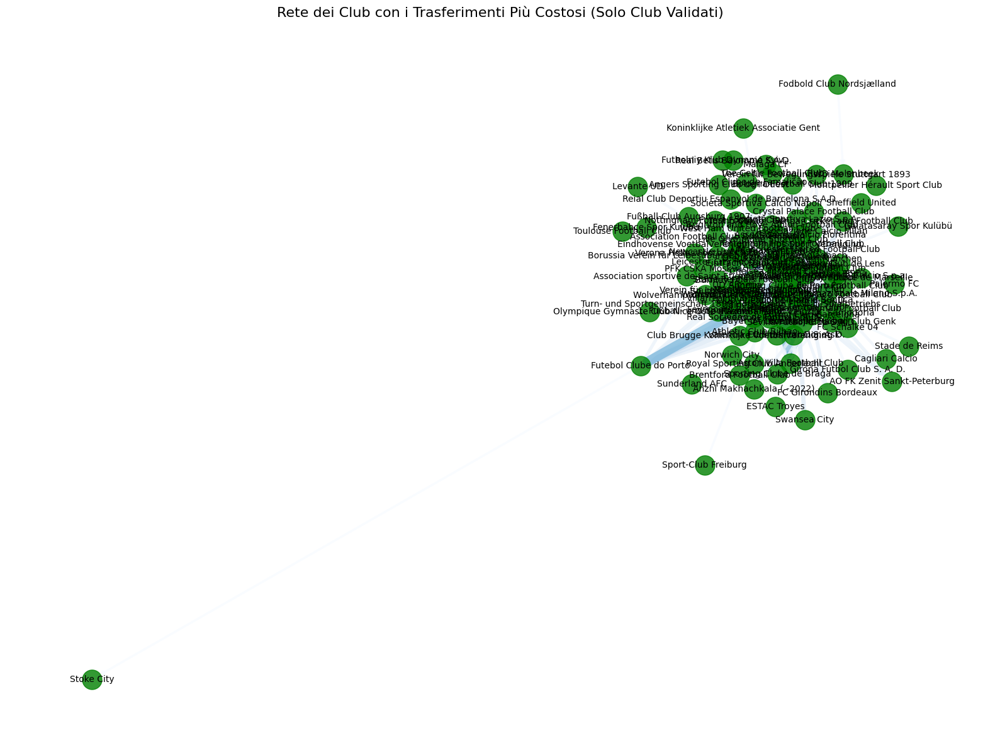


=== Fine della visualizzazione dei trasferimenti più costosi (solo club validi) ===

=== Metriche del grafo ===
Numero di nodi: 109
Numero di archi: 412
Densità del grafo: 0.035
Clustering medio: 0.22
Raggio del grafo: None
Diametro del grafo: None
Grado dei nodi: {'Associazione Calcio Fiorentina': 4, 'Juventus Football Club': 25, 'Manchester United Football Club': 29, 'Società Sportiva Calcio Napoli': 15, 'Arsenal Football Club': 29, 'Crystal Palace Football Club': 5, 'Paris Saint-Germain Football Club': 20, 'Chelsea Football Club': 40, 'Atalanta Bergamasca Calcio S.p.a.': 6, 'Real Sociedad de Fútbol S.A.D.': 5, 'Valencia Club de Fútbol S. A. D.': 8, 'Liverpool Football Club': 15, 'The Celtic Football Club': 2, 'Brighton and Hove Albion Football Club': 13, 'Fenerbahçe Spor Kulübü': 1, 'Fulham Football Club': 8, 'Club Atlético de Madrid S.A.D.': 20, 'Sport Lisboa e Benfica': 14, 'Leeds United': 8, 'Stade Rennais Football Club': 11, 'Futebol Clube do Porto': 12, 'Association Football C

In [31]:
# ------------------------------------------------------
# 14. VISUALIZZAZIONE DEI TRASFERIMENTI COSTOSI VALIDATI
# ------------------------------------------------------
print("\n=== 14. Visualizzazione dei trasferimenti più costosi (solo club validi) ===")

# Aumento la dimensione della figura per migliorare la leggibilità
plt.figure(figsize=(16, 12))

# Layout per la disposizione dei nodi
pos = nx.spring_layout(G_expensive_valid, seed=42, k=0.5, iterations=200)

# Disegnare i nodi con colore giallo
nx.draw_networkx_nodes(G_expensive_valid, pos, node_size=500, node_color='green', alpha=0.8)

# Disegnare gli archi (pesati in base al costo del trasferimento)
edges, costs = zip(*nx.get_edge_attributes(G_expensive_valid, 'cost').items())
nx.draw_networkx_edges(
    G_expensive_valid,
    pos,
    edgelist=edges,
    width=[c / 1e7 for c in costs],  # Archi più larghi per i trasferimenti costosi
    edge_color=costs,  # Colore degli archi in base al costo
    edge_cmap=plt.cm.Blues,  # Cambiamo il colore a una mappa di colori (Blu per i trasferimenti più costosi)
    alpha=0.7
)

# Disegnare le etichette dei nodi (nomi dei club)
nx.draw_networkx_labels(G_expensive_valid, pos, font_size=10, font_color='black')

# Titolo
plt.title("Rete dei Club con i Trasferimenti Più Costosi (Solo Club Validati)", fontsize=16)
plt.axis('off')  # Nascondi gli assi
plt.tight_layout()  # Ottimizzare la disposizione
plt.show()

print("\n=== Fine della visualizzazione dei trasferimenti più costosi (solo club validi) ===")

calculate_and_print_graph_metrics(G_expensive_valid)

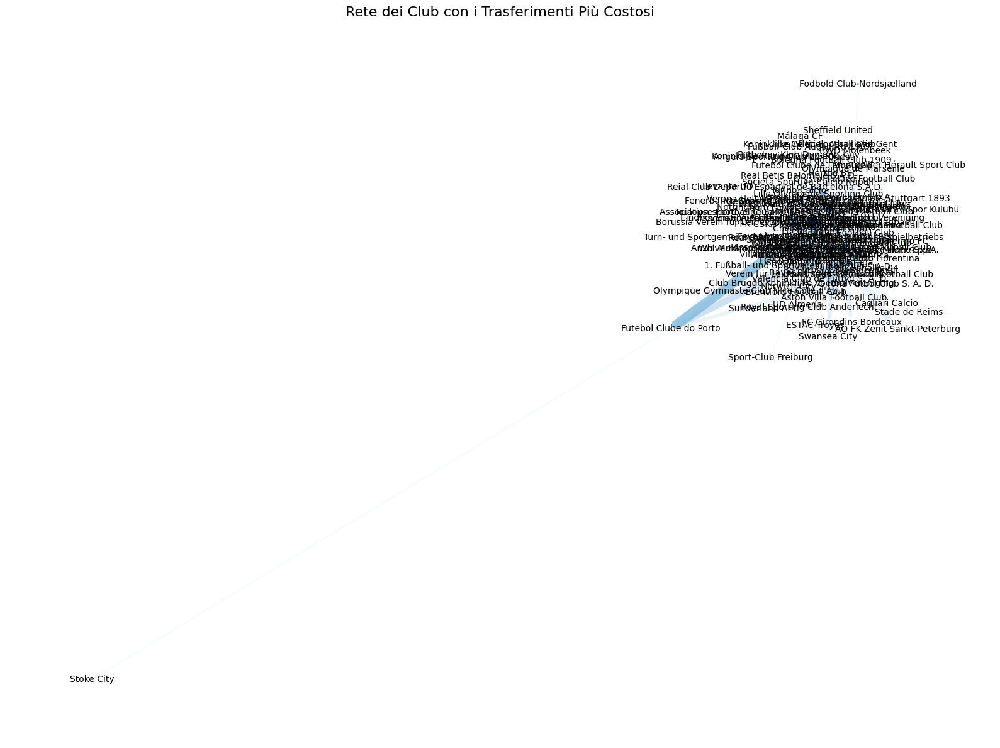

In [32]:
import networkx as nx
import matplotlib.pyplot as plt

# 1. Modifica del Layout
# Proviamo il layout Kamada-Kawai, che solitamente offre una disposizione più naturale
pos = nx.kamada_kawai_layout(G_expensive_valid)

# 2. Aumento delle iterazioni (per una disposizione migliore)
# Questo aiuterà a separare meglio i nodi e fare in modo che il grafo si stabilizzi
pos = nx.spring_layout(G_expensive_valid, seed=42, k=0.5, iterations=300)

# 3. Disegnare il grafo
plt.figure(figsize=(16, 12))

# Disegnare i nodi (dimensioni e colore)
node_sizes = [G_expensive_valid.nodes[node].get("market_value", 1000000) / 1000000 for node in G_expensive_valid.nodes()]
nx.draw_networkx_nodes(G_expensive_valid, pos, node_size=node_sizes, node_color='green', alpha=0.8)

# Disegnare gli archi (larghezza in base al costo dei trasferimenti)
edges, costs = zip(*nx.get_edge_attributes(G_expensive_valid, 'cost').items())
nx.draw_networkx_edges(
    G_expensive_valid,
    pos,
    edgelist=edges,
    width=[c / 1e7 for c in costs],
    edge_color=costs,
    edge_cmap=plt.cm.Blues,
    alpha=0.7
)

# Disegnare le etichette (nomi dei club)
nx.draw_networkx_labels(G_expensive_valid, pos, font_size=10, font_color='black')

# Titolo
plt.title("Rete dei Club con i Trasferimenti Più Costosi", fontsize=16)
plt.axis('off')  # Nascondi gli assi
plt.tight_layout()  # Ottimizzare la disposizione
plt.show()

In [33]:
# ------------------------------------------------------
# 11. VISUALIZZARE I TRASFERIMENTI PIÙ COSTOSI CON NOME DEL GIOCATORE
# ------------------------------------------------------

print("\n=== 11. Visualizzazione dei trasferimenti più costosi con il nome del giocatore ===")

# Definiamo una soglia per i trasferimenti più costosi (ad esempio, top 0.1% dei trasferimenti più costosi)
cost_threshold = transfers["transfer_fee"].quantile(0.999)  # Prendiamo lo 0.1% dei trasferimenti più costosi

# Filtriamo i trasferimenti con costo maggiore della soglia
expensive_transfers = transfers[transfers["transfer_fee"] >= cost_threshold]

print(f"\nNumero di trasferimenti più costosi (oltre il {cost_threshold} di valore): {len(expensive_transfers)}")
print(expensive_transfers.head(500))

# Creiamo il grafo per i trasferimenti più costosi
G_expensive = nx.DiGraph()

# Aggiungiamo gli archi per i trasferimenti più costosi, includendo il nome del giocatore
for idx, row in expensive_transfers.iterrows():
    from_club = row["from_club_id"]
    to_club = row["to_club_id"]
    player_name = row["player_name"]  # Nome del giocatore
    
    if G_expensive.has_edge(from_club, to_club):
        # Incrementa il peso (numero di trasferimenti) e aggiungi il costo
        G_expensive[from_club][to_club]["weight"] += 1
        G_expensive[from_club][to_club]["cost"] += row["transfer_fee"]
        G_expensive[from_club][to_club]["player_name"] = player_name  # Aggiungi nome del giocatore all'arco
    else:
        # Aggiungi l'arco con peso 1
        G_expensive.add_edge(from_club, to_club, weight=1, cost=row["transfer_fee"], player_name=player_name)

print(f"\nNumero di nodi (club) nel grafo dei trasferimenti costosi: {G_expensive.number_of_nodes()}")
print(f"Numero di archi (trasferimenti costosi) nel grafo: {G_expensive.number_of_edges()}")



=== 11. Visualizzazione dei trasferimenti più costosi con il nome del giocatore ===

Numero di trasferimenti più costosi (oltre il 65000000.0 di valore): 54
       player_id transfer_date transfer_season  from_club_id  to_club_id  \
1621      576024    2024-08-12           24/25           281          13   
8453      550550    2024-01-01           23/24           294         583   
9254      487969    2023-09-01           23/24            24         583   
10084     687626    2023-08-14           23/24          1237         631   
10097     132098    2023-08-12           23/24           148          27   
10335     475959    2023-08-05           23/24         23826         281   
10340     610442    2023-08-05           23/24           800         985   
11087     357662    2023-07-15           23/24           379          11   
11613     451276    2023-07-02           23/24         23826          31   
11902     309400    2023-07-01           23/24           631          11   
12240 


=== 13. Visualizzazione dei trasferimenti più costosi con nome del giocatore sugli archi (senza sfondo) ===


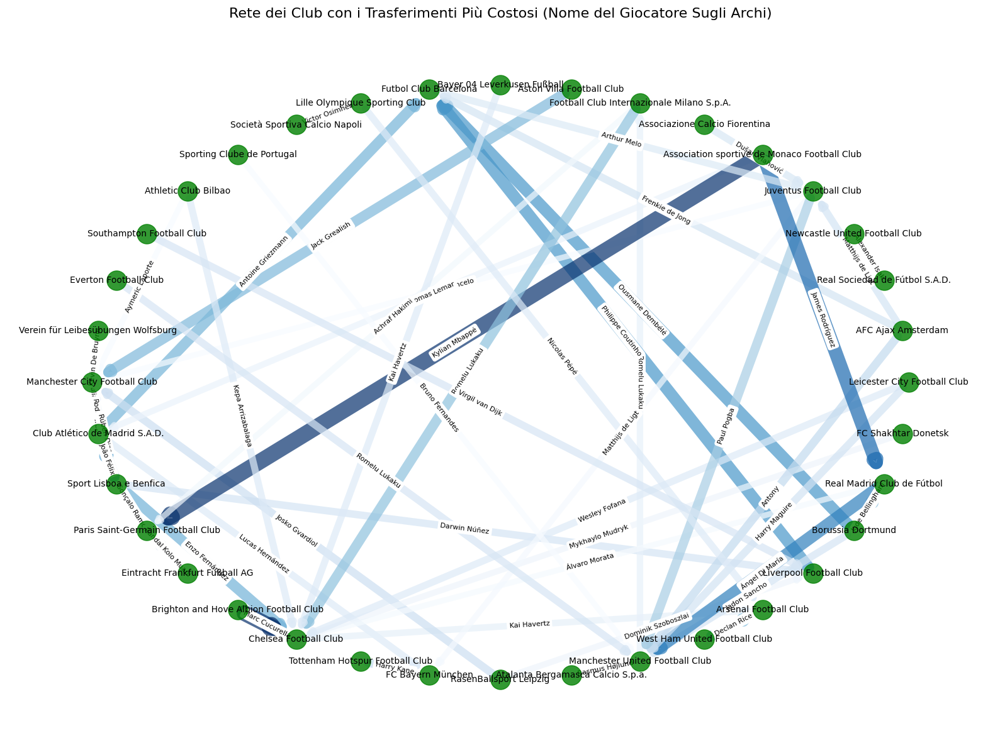


=== Fine della visualizzazione dei trasferimenti più costosi con nome del giocatore sugli archi (senza sfondo) ===

=== Metriche del grafo ===
Numero di nodi: 36
Numero di archi: 51
Densità del grafo: 0.04
Clustering medio: 0.047
Raggio del grafo: None
Diametro del grafo: None
Grado dei nodi: {'Manchester City Football Club': 8, 'Club Atlético de Madrid S.A.D.': 6, 'Sport Lisboa e Benfica': 5, 'Paris Saint-Germain Football Club': 4, 'Eintracht Frankfurt Fußball AG': 1, 'Brighton and Hove Albion Football Club': 1, 'Chelsea Football Club': 9, 'Tottenham Hotspur Football Club': 1, 'FC Bayern München': 3, 'RasenBallsport Leipzig': 2, 'Atalanta Bergamasca Calcio S.p.a.': 1, 'Manchester United Football Club': 9, 'West Ham United Football Club': 1, 'Arsenal Football Club': 3, 'Liverpool Football Club': 4, 'Borussia Dortmund': 3, 'Real Madrid Club de Fútbol': 4, 'FC Shakhtar Donetsk': 1, 'Leicester City Football Club': 2, 'AFC Ajax Amsterdam': 3, 'Real Sociedad de Fútbol S.A.D.': 1, 'Newcastl

In [ ]:
# ------------------------------------------------------
# 12. RILABEL DEI NODI CON I NOMI DEI CLUB
# ------------------------------------------------------

# Rilabel dei nodi nel grafo con i nomi dei club
nx.relabel_nodes(G_expensive, club_id_to_name, copy=False)

# ------------------------------------------------------
# 13. VISUALIZZAZIONE DEI TRASFERIMENTI COSTOSI CON NOME DEL GIOCATORE SENZA SFONDO
# ------------------------------------------------------

print("\n=== 13. Visualizzazione dei trasferimenti più costosi con nome del giocatore sugli archi (senza sfondo) ===")

# Aumento la dimensione della figura per migliorare la leggibilità
plt.figure(figsize=(16, 12))

# Layout per la disposizione dei nodi
pos = nx.shell_layout(G_expensive)

# Disegnare i nodi con colore verde
nx.draw_networkx_nodes(G_expensive, pos, node_size=500, node_color='green', alpha=0.8)

# Disegnare gli archi (larghezza in base al costo del trasferimento)
edges, costs = zip(*nx.get_edge_attributes(G_expensive, 'cost').items())
nx.draw_networkx_edges(
    G_expensive,
    pos,
    edgelist=edges,
    width=[c / 1e7 for c in costs],
    edge_color=costs,
    edge_cmap=plt.cm.Blues,
    alpha=0.7
)

# Disegnare le etichette dei nodi (nomi dei club)
nx.draw_networkx_labels(G_expensive, pos, font_size=10, font_color='black')

# Disegnare le etichette degli archi (nome del giocatore)
edge_labels = nx.get_edge_attributes(G_expensive, 'player_name')

# Visualizzare le etichette degli archi senza sfondo
nx.draw_networkx_edge_labels(
    G_expensive, 
    pos, 
    edge_labels=edge_labels, 
    font_size=8, 
    font_color='black',  # Colore del testo
    font_weight='normal',  # Nessun bold
    verticalalignment='center',  # Allineamento verticale
    horizontalalignment='center',  # Allineamento orizzontale
    label_pos=0.5,  # Posizione dell'etichetta sugli archi
    ax=plt.gca()  # Usa l'asse corrente per disegnare
)

# Titolo
plt.title("Rete dei Club con i Trasferimenti Più Costosi (Nome del Giocatore Sugli Archi)", fontsize=16)
plt.axis('off')  # Nascondi gli assi
plt.tight_layout()  # Ottimizzare la disposizione
plt.show()

print("\n=== Fine della visualizzazione dei trasferimenti più costosi con nome del giocatore sugli archi (senza sfondo) ===")

calculate_and_print_graph_metrics(G_expensive)

# Link prediction

In [35]:
%pip install scikit-learn

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.1.1 -> 24.3.1
[notice] To update, run: /Applications/Xcode.app/Contents/Developer/usr/bin/python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [40]:
from node2vec import Node2Vec

# Creazione dell'oggetto Node2Vec
node2vec = Node2Vec(G, dimensions=64, walk_length=30, num_walks=200, workers=4)

# Addestramento del modello
model = node2vec.fit()

# Ora possiamo ottenere gli embedding per ogni nodo (squadra)
embeddings = {node: model.wv.get_vector(node) for node in G.nodes()}

# Per visualizzare gli embedding per un nodo specifico
print(f"Embedding per il nodo Football Club Internazionale Milano S.p.A.): {embeddings['Football Club Internazionale Milano S.p.A.']}")

Generating walks (CPU: 4): 100%|██████████| 50/50 [00:02<00:00, 18.77it/s]


Embedding per il nodo Football Club Internazionale Milano S.p.A.): [ 0.38260695 -0.35077894  0.16583087  0.1097926   0.0111455   0.13058607
 -0.48239666  0.08219054  0.07036038 -0.03214051 -0.24558593 -0.32429218
  0.19074918  0.3096177   0.23792186  0.15167966 -0.15397201 -0.20399825
 -0.20539635  0.27876633  0.5209788   0.19092317  0.11504822 -0.0420316
 -0.14007232  0.5779796  -0.28458917  0.0135824  -0.10622617 -0.23029236
  0.3845113   0.07142314  0.05800023  0.40070397 -0.45709503 -0.0343515
  0.23822302  0.10081287  0.05357431  0.29784334 -0.00406066  0.05607696
  0.09836846 -0.14396901  0.05279572 -0.21907233 -0.22831102 -0.13351502
  0.24163795  0.3814728  -0.04377502  0.27629068 -0.0703761  -0.12037892
  0.06349639  0.14072117  0.12421127 -0.23773813 -0.23466188  0.18447942
 -0.14057174 -0.17460589  0.02321525 -0.51283765]


In [41]:
from sklearn.metrics.pairwise import cosine_similarity

# Prendi l'embedding del nodo "FC Internazionale"
node_name = "Football Club Internazionale Milano S.p.A."  # Il nome del club
embedding_internazionale = embeddings.get(node_name)

if embedding_internazionale is not None:
    # Calcola la similarità coseno tra l'embedding di "FC Internazionale" e gli altri nodi
    similarities = {}
    for node, embedding in embeddings.items():
        if node != node_name:  # Evita di confrontare il nodo con sé stesso
            sim = cosine_similarity(embedding_internazionale.reshape(1, -1), embedding.reshape(1, -1))
            similarities[node] = sim[0][0]

    # Ordina le similarità in ordine decrescente
    sorted_similarities = sorted(similarities.items(), key=lambda x: x[1], reverse=True)

    # Visualizza le prime 5 squadre più simili a "FC Internazionale"
    print(f"Le squadre più simili a {node_name}:")
    for team, sim in sorted_similarities[:5]:
        print(f"{team}: Similarità = {sim:.4f}")
else:
    print(f"Il nodo '{node_name}' non è stato trovato nel grafo.")

Le squadre più simili a Football Club Internazionale Milano S.p.A.:
Juventus Football Club: Similarità = 0.7689
Cesena FC: Similarità = 0.7501
Atalanta Bergamasca Calcio S.p.a.: Similarità = 0.7169
Delfino Pescara 1936: Similarità = 0.7075
Associazione Calcio Monza: Similarità = 0.7053


In [64]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Prevedere collegamenti: calcoliamo la similarità tra tutte le coppie di nodi
all_node_pairs = [(node_u, node_v) for node_u in G.nodes() for node_v in G.nodes() if node_u != node_v]

# Calcoliamo la similarità coseno per ogni coppia di nodi
similarities = {}
for node_u, node_v in all_node_pairs:
    embedding_u = embeddings[node_u].reshape(1, -1)
    embedding_v = embeddings[node_v].reshape(1, -1)
    sim = cosine_similarity(embedding_u, embedding_v)
    similarities[(node_u, node_v)] = sim[0][0]

# Visualizzare le coppie di nodi con alta similarità (probabilità di un nuovo collegamento)
sorted_similarities = sorted(similarities.items(), key=lambda x: x[1], reverse=True)

# Stampare le prime 5 coppie di nodi più simili
for pair, sim in sorted_similarities[:5]:
    print(f"Similarità tra {pair[0]} e {pair[1]}: {sim:.4f}")

print(len(sorted_similarities))

Similarità tra Livingston FC e Partick Thistle FC: 0.9035
Similarità tra Partick Thistle FC e Livingston FC: 0.9035
Similarità tra Motherwell Football Club e Partick Thistle FC: 0.8919
Similarità tra Partick Thistle FC e Motherwell Football Club: 0.8919
Similarità tra FC Shakhtar Donetsk e FK Mariupol: 0.8908
192282


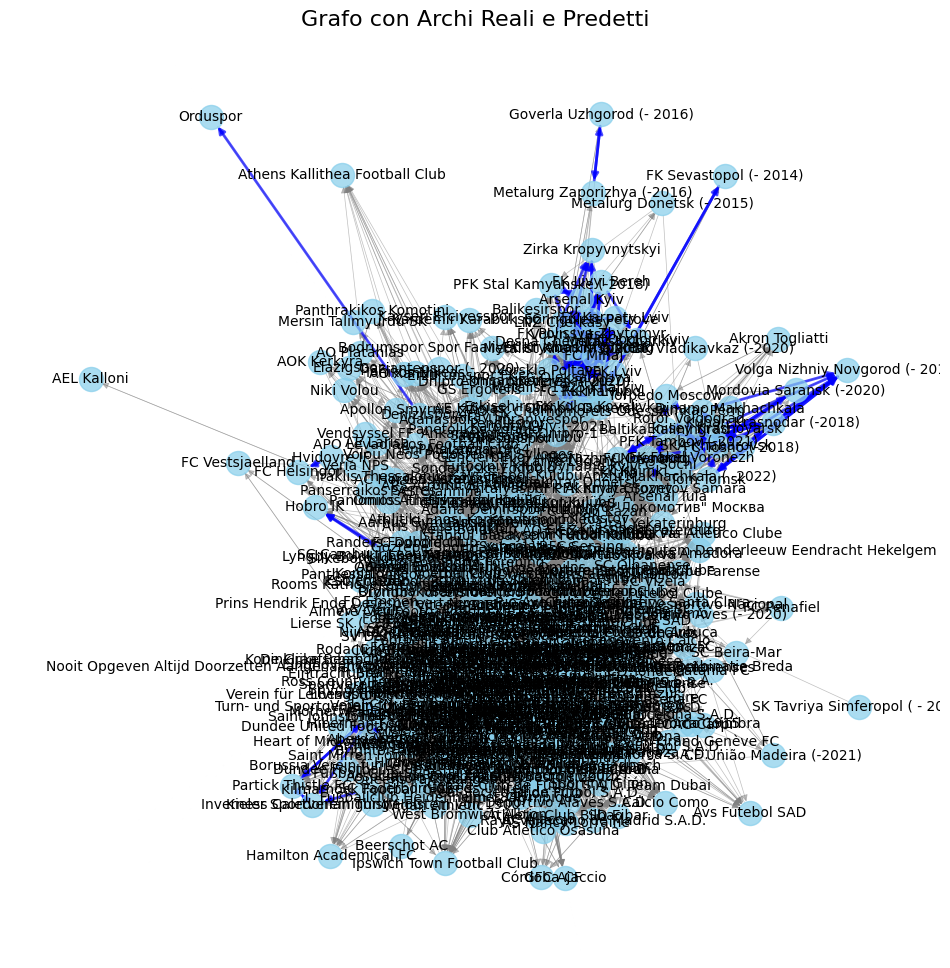

Numero di archi predetti: 138


In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Supponiamo che 'similarities' contenga le similarità tra i nodi, calcolate tramite un algoritmo di embedding o una metrica di similarità
threshold = 0.8  # Soglia di similarità

# Lista per gli archi predetti
predicted_edges = []

# Aggiungi archi predetti se la similarità tra i nodi supera la soglia
for (node_u, node_v), sim in sorted_similarities:  # sorted_similarities è una lista di tuple (nodo_u, nodo_v, similarità)
    if sim > threshold and not G.has_edge(node_u, node_v):
        predicted_edges.append((node_u, node_v))

# Crea un nuovo grafo per la visualizzazione
G_vis = G.copy()

# Aggiungi solo gli archi predetti al grafo
G_vis.add_edges_from(predicted_edges)

# Definisci un layout uniforme per i nodi
pos = nx.spring_layout(G_vis, seed=42)  # 'seed' per rendere il layout riproducibile

# Ottieni gli archi reali dal grafo (archi esistenti)
real_edges = list(G.edges())

# Verifica che i nodi reali siano presenti anche nel grafo visibile (G_vis)
real_edges = [(u, v) for u, v in real_edges if u in G_vis.nodes() and v in G_vis.nodes()]

# Visualizza il grafo con colori diversi per gli archi reali e predetti
plt.figure(figsize=(12, 12))

# Disegna gli archi reali (in nero)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=real_edges, edge_color="gray", width=0.5, alpha=0.5
)

# Disegna gli archi predetti (in blu)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=predicted_edges, edge_color="blue", width=2, alpha=0.7
)

# Assegna un colore uniforme per i nodi (puoi usare un colore personalizzato)
node_colors = ['skyblue']   # Usa 'skyblue' o qualsiasi altro colore preferito

# Disegna i nodi
nx.draw_networkx_nodes(G_vis, pos, node_color=node_colors, node_size=300, alpha=0.7)

# Disegna le etichette dei nodi
nx.draw_networkx_labels(G_vis, pos, font_size=10)

plt.title("Grafo con Archi Reali e Predetti", fontsize=16)
plt.axis("off")  # Rimuovi gli assi per una visualizzazione più pulita
plt.show()

# Stampa il numero di archi predetti
print(f"Numero di archi predetti: {len(predicted_edges)}")

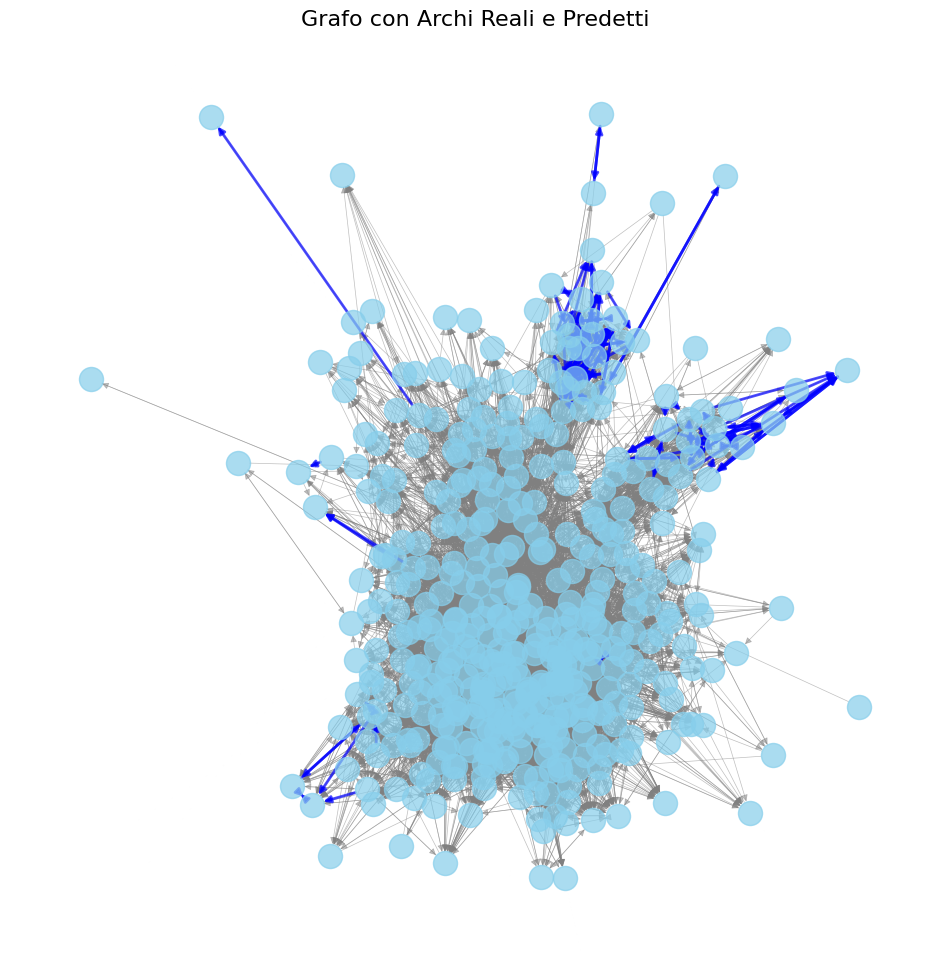

Numero di archi predetti: 138


In [70]:
import matplotlib.pyplot as plt
import networkx as nx

# Supponiamo che 'similarities' contenga le similarità tra i nodi, calcolate tramite un algoritmo di embedding o una metrica di similarità
threshold = 0.8  # Soglia di similarità

# Lista per gli archi predetti
predicted_edges = []

# Aggiungi archi predetti se la similarità tra i nodi supera la soglia
for (node_u, node_v), sim in sorted_similarities:  # sorted_similarities è una lista di tuple (nodo_u, nodo_v, similarità)
    if sim > threshold and not G.has_edge(node_u, node_v):
        predicted_edges.append((node_u, node_v))

# Crea un nuovo grafo per la visualizzazione
G_vis = G.copy()

# Aggiungi solo gli archi predetti al grafo
G_vis.add_edges_from(predicted_edges)

# Definisci un layout uniforme per i nodi
pos = nx.spring_layout(G_vis, seed=42)  # 'seed' per rendere il layout riproducibile

# Ottieni gli archi reali dal grafo (archi esistenti)
real_edges = list(G.edges())

# Verifica che i nodi reali siano presenti anche nel grafo visibile (G_vis)
real_edges = [(u, v) for u, v in real_edges if u in G_vis.nodes() and v in G_vis.nodes()]

# Visualizza il grafo con colori diversi per gli archi reali e predetti
plt.figure(figsize=(12, 12))

# Disegna gli archi reali (in nero)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=real_edges, edge_color="gray", width=0.5, alpha=0.5
)

# Disegna gli archi predetti (in blu)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=predicted_edges, edge_color="blue", width=2, alpha=0.7
)

# Assegna un colore uniforme per i nodi (puoi usare un colore personalizzato)
node_colors = ['skyblue']   # Usa 'skyblue' o qualsiasi altro colore preferito

# Disegna i nodi
nx.draw_networkx_nodes(G_vis, pos, node_color=node_colors, node_size=300, alpha=0.7)

# Disegna le etichette dei nodi
#nx.draw_networkx_labels(G_vis, pos, font_size=10)

plt.title("Grafo con Archi Reali e Predetti", fontsize=16)
plt.axis("off")  # Rimuovi gli assi per una visualizzazione più pulita
plt.show()

# Stampa il numero di archi predetti
print(f"Numero di archi predetti: {len(predicted_edges)}")

In [65]:
print(sorted_similarities[:5])

[(('Motherwell Football Club', 'Partick Thistle FC'), 0.9020952), (('Partick Thistle FC', 'Motherwell Football Club'), 0.9020952), (('Baltika Kaliningrad', 'PFK Tambov (-2021)'), 0.9020804), (('PFK Tambov (-2021)', 'Baltika Kaliningrad'), 0.9020804), (('FK Kryvbas Kryvyi Rig', 'FC Minaj'), 0.89236975)]


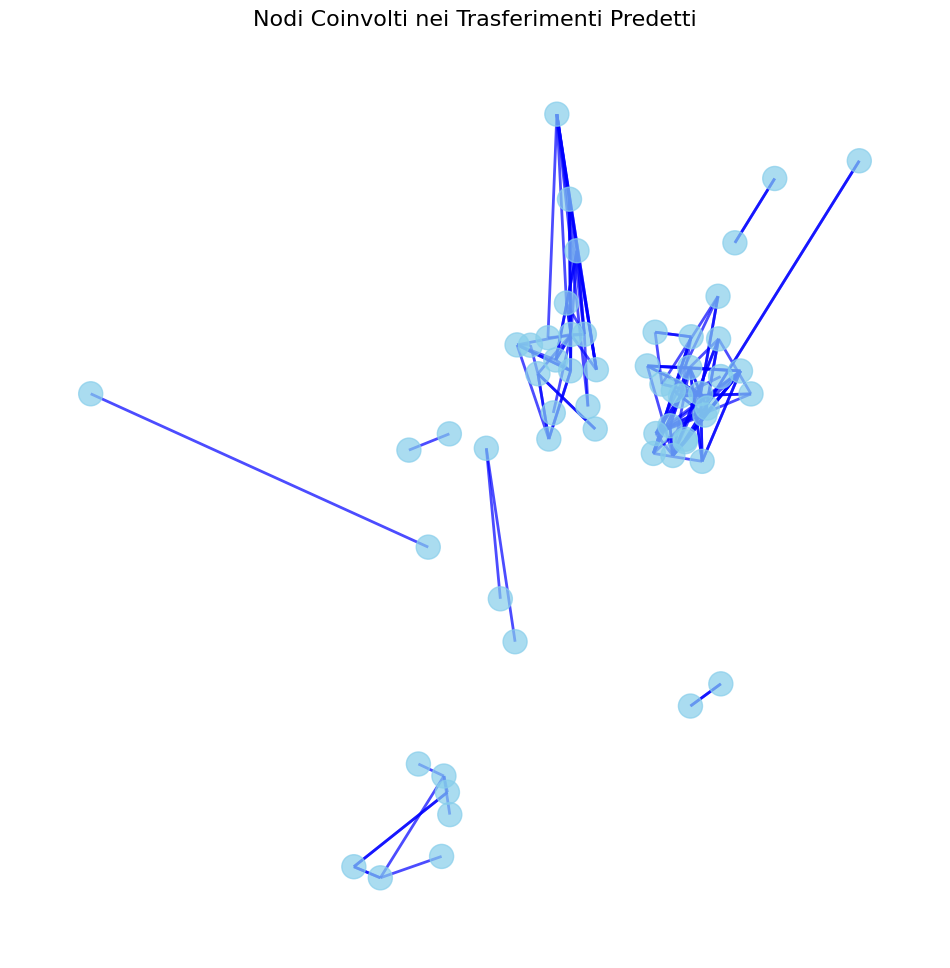

Nodi coinvolti nei trasferimenti predetti: {'FC Minaj', 'ZAO FK Chornomorets Odessa', 'PFK Lviv', 'FK Livyi Bereh', 'FC Orenburg', 'FK Kolos Kovalivka', 'Partick Thistle FC', 'Metalurg Zaporizhya (-2016)', 'Livingston FC', 'Kuban Krasnodar (-2018)', 'FC Helsingör', 'FC Tosno (-2018)', 'PFK Stal Kamyanske (-2018)', 'SKA Khabarovsk', 'Enisey Krasnoyarsk', 'FC Ingulets Petrove', 'Torpedo Moscow', 'FC Oleksandriya', 'Anzhi Makhachkala ( -2022)', 'FK Karpaty Lviv', 'Goverla Uzhgorod (- 2016)', 'Silkeborg Idrætsforening', 'Hobro IK', 'Volga Nizhniy Novgorod (- 2016)', 'NK Veres Rivne', 'LNZ Cherkasy', 'Metalist Kharkiv', 'FK Nizhny Novgorod', 'Mordovia Saransk (-2020)', 'FC Rukh Lviv', 'Baltika Kaliningrad', 'Metalist 1925 Kharkiv', 'Rotor Volgograd', 'Hvidovre IF', 'Saint Johnstone Football Club', 'Volyn Lutsk', 'Tom Tomsk', 'Amkar Perm', 'Odense Boldklub', 'FK Sevastopol (- 2014)', 'FK Obolon Kyiv', 'Saint Mirren Football Club', 'PFK Krylya Sovetov Samara', 'Motherwell Football Club', 'FK 

In [79]:
import matplotlib.pyplot as plt
import networkx as nx

# Supponiamo che 'similarities' contenga le similarità tra i nodi, calcolate tramite un algoritmo di embedding o una metrica di similarità
threshold = 0.8  # Soglia di similarità

# Lista per gli archi predetti
predicted_edges = []

# Aggiungi archi predetti se la similarità tra i nodi supera la soglia
for (node_u, node_v), sim in sorted_similarities:  # sorted_similarities è una lista di tuple (nodo_u, nodo_v, similarità)
    if sim > threshold and not G.has_edge(node_u, node_v):
        predicted_edges.append((node_u, node_v))

# Crea un nuovo grafo per la visualizzazione
G_vis = nx.Graph()

# Aggiungi solo gli archi predetti al grafo
G_vis.add_edges_from(predicted_edges)

# Definisci un layout per i nodi utilizzando il grafo originale
pos = nx.spring_layout(G, seed=42)  # Usa lo stesso layout per mantenere le posizioni originali

# Estrai i nodi coinvolti negli archi predetti
nodes_in_predicted_edges = set()
for u, v in predicted_edges:
    nodes_in_predicted_edges.add(u)
    nodes_in_predicted_edges.add(v)

# Filtra i nodi che sono coinvolti negli archi predetti
filtered_nodes = [node for node in G.nodes() if node in nodes_in_predicted_edges]

# Visualizza solo i nodi coinvolti nei trasferimenti predetti
plt.figure(figsize=(12, 12))

# Assegna il colore giusto ai nodi coinvolti
node_colors = ['skyblue' if node in nodes_in_predicted_edges else 'lightgray' for node in filtered_nodes]

# Disegna i nodi filtrati
nx.draw_networkx_nodes(G, pos, nodelist=filtered_nodes, node_color=node_colors, node_size=300, alpha=0.7)

# Disegna gli archi predetti (in blu)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=predicted_edges, edge_color="blue", width=2, alpha=0.7
)

# Aggiungi le etichette dei nodi (opzionale)
#nx.draw_networkx_labels(G, pos, font_size=10)  # Non usare 'nodelist' qui, disegna le etichette per tutti i nodi

plt.title("Nodi Coinvolti nei Trasferimenti Predetti", fontsize=16)
plt.axis("off")  # Rimuovi gli assi per una visualizzazione più pulita
plt.show()

# Stampa i nodi coinvolti negli archi predetti
print(f"Nodi coinvolti nei trasferimenti predetti: {nodes_in_predicted_edges}")

## Per grafo italia (con svincolati)

In [90]:
# Creazione dell'oggetto Node2Vec
node2vec = Node2Vec(G_italian_svincolati, dimensions=64, walk_length=30, num_walks=200, workers=4)

# Addestramento del modello
model = node2vec.fit()

# Ora possiamo ottenere gli embedding per ogni nodo (squadra)
embeddings = {node: model.wv.get_vector(node) for node in G_italian_svincolati.nodes()}

# Per visualizzare gli embedding per un nodo specifico
print(f"Embedding per il nodo Football Club Internazionale Milano S.p.A.): {embeddings['Football Club Internazionale Milano S.p.A.']}")

Computing transition probabilities: 100%|██████████| 39/39 [00:00<00:00, 1231.10it/s]


Generating walks (CPU: 1): 100%|██████████| 50/50 [00:00<00:00, 312.05it/s]


Embedding per il nodo Football Club Internazionale Milano S.p.A.): [ 0.04275015 -0.12919939  0.05576397 -0.04794879  0.0616906  -0.25273183
  0.03747782  0.1783303  -0.04440161 -0.13166742  0.09261715 -0.00593073
  0.02482513  0.1091793  -0.04720519  0.01460666 -0.07184732  0.10984793
  0.0286902   0.06986983  0.177155   -0.01993891  0.20761064 -0.04076418
  0.03396055  0.08136019 -0.18121201 -0.00046217 -0.02273963 -0.04116092
  0.02384103 -0.00074156 -0.0416145  -0.09935426  0.04507055  0.05531718
  0.01372233  0.07253981  0.24191722 -0.05005391 -0.01829462  0.03681317
 -0.06723781 -0.16504702  0.05102252 -0.17595904  0.04736897 -0.07074812
  0.11643045  0.21381107 -0.0276886   0.12255802  0.06390314  0.20295393
  0.33549663  0.2649329   0.14617062 -0.10549641 -0.01736729  0.01637229
  0.12160603 -0.29505926 -0.2064189  -0.04006933]


In [91]:
from sklearn.metrics.pairwise import cosine_similarity

# Prendi l'embedding del nodo "FC Internazionale"
node_name = "Football Club Internazionale Milano S.p.A."  # Il nome del club
embedding_internazionale = embeddings.get(node_name)

if embedding_internazionale is not None:
    # Calcola la similarità coseno tra l'embedding di "FC Internazionale" e gli altri nodi
    similarities = {}
    for node, embedding in embeddings.items():
        if node != node_name:  # Evita di confrontare il nodo con sé stesso
            sim = cosine_similarity(embedding_internazionale.reshape(1, -1), embedding.reshape(1, -1))
            similarities[node] = sim[0][0]

    # Ordina le similarità in ordine decrescente
    sorted_similarities = sorted(similarities.items(), key=lambda x: x[1], reverse=True)

    # Visualizza le prime 5 squadre più simili a "FC Internazionale"
    print(f"Le squadre più simili a {node_name}:")
    for team, sim in sorted_similarities[:5]:
        print(f"{team}: Similarità = {sim:.4f}")
else:
    print(f"Il nodo '{node_name}' non è stato trovato nel grafo.")

Le squadre più simili a Football Club Internazionale Milano S.p.A.:
Juventus Football Club: Similarità = 0.7707
Atalanta Bergamasca Calcio S.p.a.: Similarità = 0.7704
Associazione Calcio Fiorentina: Similarità = 0.7533
Società Sportiva Calcio Napoli: Similarità = 0.7462
Verona Hellas Football Club: Similarità = 0.7456


In [92]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Prevedere collegamenti: calcoliamo la similarità tra tutte le coppie di nodi
all_node_pairs = [(node_u, node_v) for node_u in G_italian_svincolati.nodes() for node_v in G_italian_svincolati.nodes() if node_u != node_v]

# Calcoliamo la similarità coseno per ogni coppia di nodi
similarities = {}
for node_u, node_v in all_node_pairs:
    embedding_u = embeddings[node_u].reshape(1, -1)
    embedding_v = embeddings[node_v].reshape(1, -1)
    sim = cosine_similarity(embedding_u, embedding_v)
    similarities[(node_u, node_v)] = sim[0][0]

# Visualizzare le coppie di nodi con alta similarità (probabilità di un nuovo collegamento)
sorted_similarities = sorted(similarities.items(), key=lambda x: x[1], reverse=True)

# Stampare le prime 5 coppie di nodi più simili
for pair, sim in sorted_similarities[:5]:
    print(f"Similarità tra {pair[0]} e {pair[1]}: {sim:.4f}")

print(len(sorted_similarities))

Similarità tra Atalanta Bergamasca Calcio S.p.a. e Società Sportiva Calcio Napoli: 0.8209
Similarità tra Società Sportiva Calcio Napoli e Atalanta Bergamasca Calcio S.p.a.: 0.8209
Similarità tra Empoli Football Club S.r.l. e UC Sampdoria: 0.8147
Similarità tra UC Sampdoria e Empoli Football Club S.r.l.: 0.8147
Similarità tra Svincolati e Brescia Calcio: 0.8049
1482


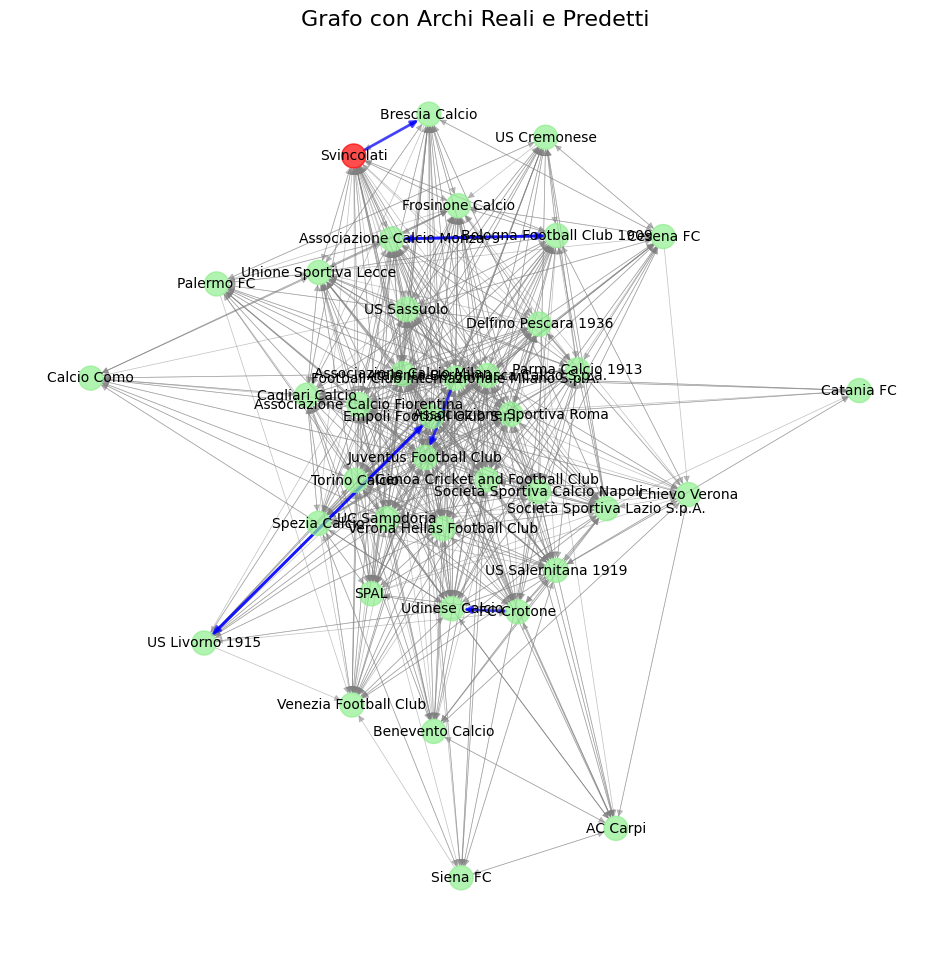

Numero di archi predetti: 7


In [93]:
import matplotlib.pyplot as plt
import networkx as nx

# Supponiamo che 'similarities' contenga le similarità tra i nodi, calcolate tramite un algoritmo di embedding o una metrica di similarità
threshold = 0.75  # Soglia di similarità

# Lista per gli archi predetti
predicted_edges = []

# Aggiungi archi predetti se la similarità tra i nodi supera la soglia
for (node_u, node_v), sim in sorted_similarities:  # sorted_similarities è una lista di tuple (nodo_u, nodo_v, similarità)
    if sim > threshold and not G_italian_svincolati.has_edge(node_u, node_v):
        predicted_edges.append((node_u, node_v))

# Crea un nuovo grafo per la visualizzazione
G_vis = G_italian_svincolati.copy()

# Aggiungi solo gli archi predetti al grafo
G_vis.add_edges_from(predicted_edges)

# Definisci un layout uniforme per i nodi
pos = nx.spring_layout(G_vis, seed=42)  # 'seed' per rendere il layout riproducibile

# Ottieni gli archi reali dal grafo (archi esistenti)
real_edges = list(G_italian_svincolati.edges())

# Verifica che i nodi reali siano presenti anche nel grafo visibile (G_vis)
real_edges = [(u, v) for u, v in real_edges if u in G_vis.nodes() and v in G_vis.nodes()]

# Visualizza il grafo con colori diversi per gli archi reali e predetti
plt.figure(figsize=(12, 12))

# Disegna gli archi reali (in nero)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=real_edges, edge_color="gray", width=0.5, alpha=0.5
)

# Disegna gli archi predetti (in blu)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=predicted_edges, edge_color="blue", width=2, alpha=0.7
)

# Assegna un colore uniforme per i nodi (puoi usare un colore personalizzato)
node_colors = ['lightgreen' if node != "Svincolati" else 'red' for node in G_italian_svincolati.nodes()]

# Disegna i nodi
nx.draw_networkx_nodes(G_vis, pos, node_color=node_colors, node_size=300, alpha=0.7)

# Disegna le etichette dei nodi
nx.draw_networkx_labels(G_vis, pos, font_size=10)

plt.title("Grafo con Archi Reali e Predetti", fontsize=16)
plt.axis("off")  # Rimuovi gli assi per una visualizzazione più pulita
plt.show()

# Stampa il numero di archi predetti
print(f"Numero di archi predetti: {len(predicted_edges)}")

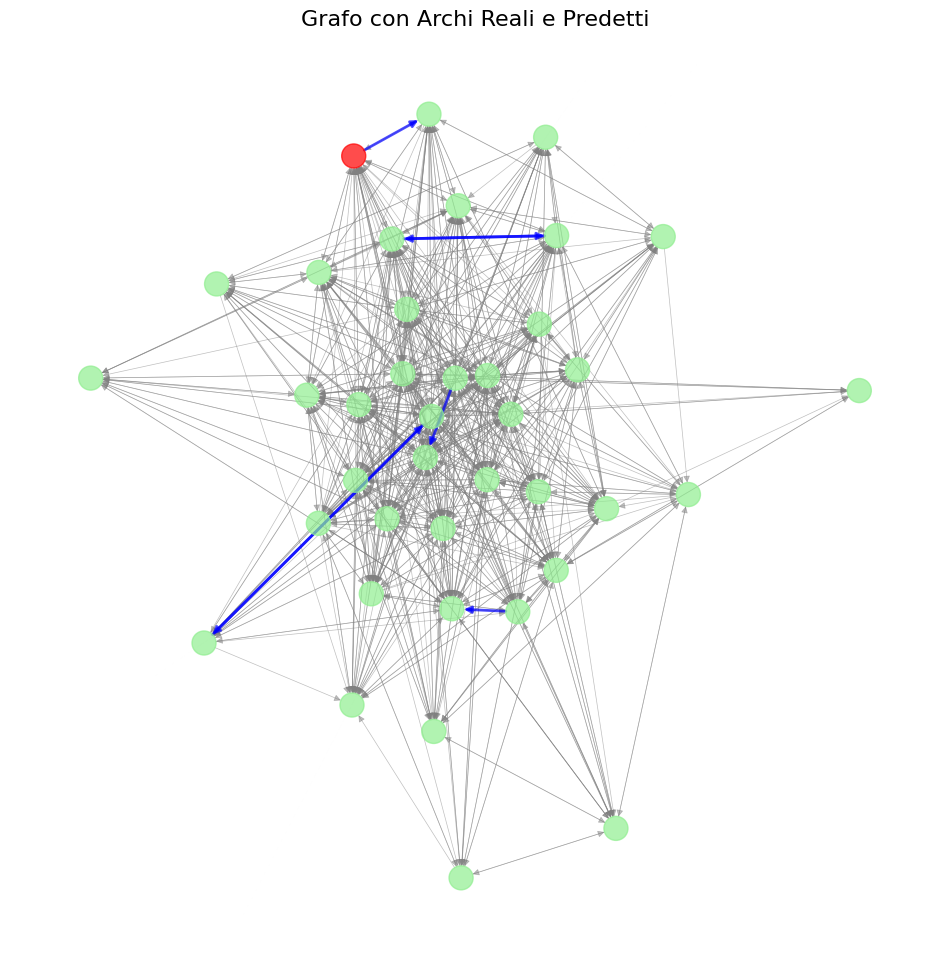

Numero di archi predetti: 7


In [94]:
import matplotlib.pyplot as plt
import networkx as nx

# Supponiamo che 'similarities' contenga le similarità tra i nodi, calcolate tramite un algoritmo di embedding o una metrica di similarità
threshold = 0.75  # Soglia di similarità

# Lista per gli archi predetti
predicted_edges = []

# Aggiungi archi predetti se la similarità tra i nodi supera la soglia
for (node_u, node_v), sim in sorted_similarities:  # sorted_similarities è una lista di tuple (nodo_u, nodo_v, similarità)
    if sim > threshold and not G_italian_svincolati.has_edge(node_u, node_v):
        predicted_edges.append((node_u, node_v))

# Crea un nuovo grafo per la visualizzazione
G_vis = G_italian_svincolati.copy()

# Aggiungi solo gli archi predetti al grafo
G_vis.add_edges_from(predicted_edges)

# Definisci un layout uniforme per i nodi
pos = nx.spring_layout(G_vis, seed=42)  # 'seed' per rendere il layout riproducibile

# Ottieni gli archi reali dal grafo (archi esistenti)
real_edges = list(G_italian_svincolati.edges())

# Verifica che i nodi reali siano presenti anche nel grafo visibile (G_vis)
real_edges = [(u, v) for u, v in real_edges if u in G_vis.nodes() and v in G_vis.nodes()]

# Visualizza il grafo con colori diversi per gli archi reali e predetti
plt.figure(figsize=(12, 12))

# Disegna gli archi reali (in nero)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=real_edges, edge_color="gray", width=0.5, alpha=0.5
)

# Disegna gli archi predetti (in blu)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=predicted_edges, edge_color="blue", width=2, alpha=0.7
)

# Assegna un colore uniforme per i nodi (puoi usare un colore personalizzato)
node_colors = ['lightgreen' if node != "Svincolati" else 'red' for node in G_italian_svincolati.nodes()]

# Disegna i nodi
nx.draw_networkx_nodes(G_vis, pos, node_color=node_colors, node_size=300, alpha=0.7)

# Disegna le etichette dei nodi
#nx.draw_networkx_labels(G_vis, pos, font_size=10)

plt.title("Grafo con Archi Reali e Predetti", fontsize=16)
plt.axis("off")  # Rimuovi gli assi per una visualizzazione più pulita
plt.show()

# Stampa il numero di archi predetti
print(f"Numero di archi predetti: {len(predicted_edges)}")

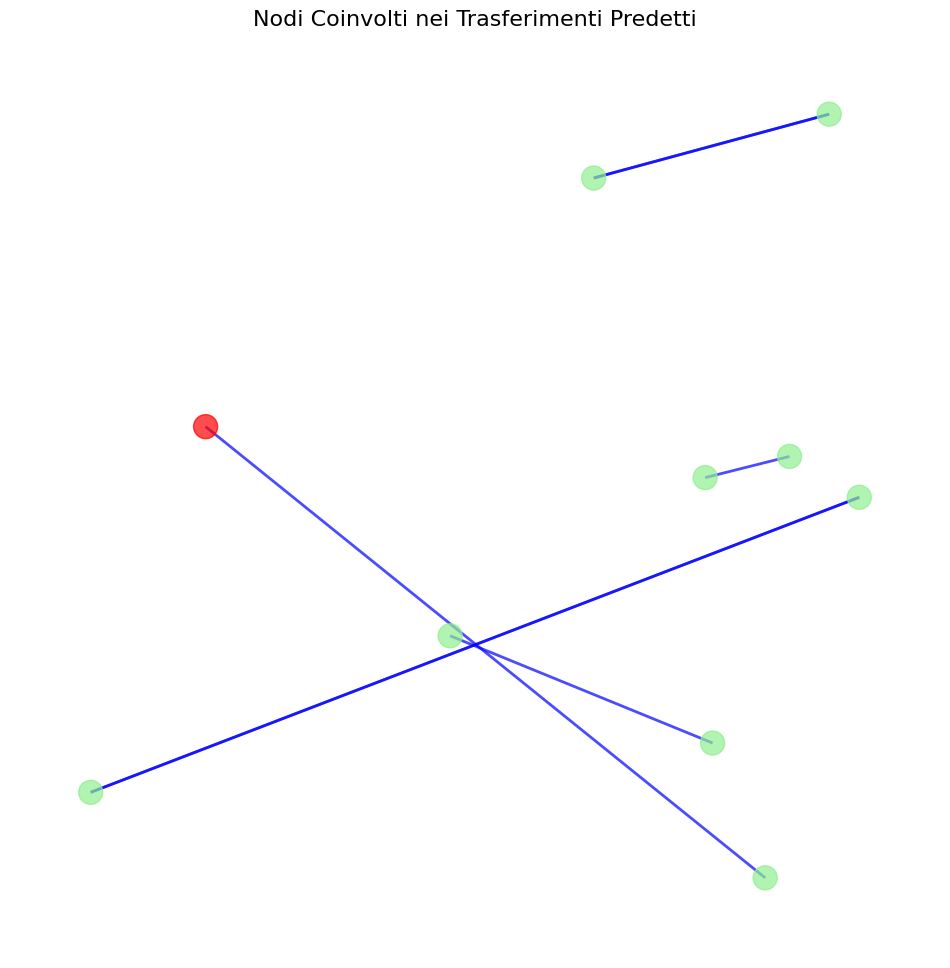

Nodi coinvolti nei trasferimenti predetti: {'Udinese Calcio', 'Empoli Football Club S.r.l.', 'Associazione Calcio Monza', 'FC Crotone', 'Svincolati', 'Juventus Football Club', 'Bologna Football Club 1909', 'Brescia Calcio', 'US Livorno 1915', 'Football Club Internazionale Milano S.p.A.'}


In [95]:
import matplotlib.pyplot as plt
import networkx as nx

# Supponiamo che 'similarities' contenga le similarità tra i nodi, calcolate tramite un algoritmo di embedding o una metrica di similarità
threshold = 0.75  # Soglia di similarità

# Lista per gli archi predetti
predicted_edges = []

# Aggiungi archi predetti se la similarità tra i nodi supera la soglia
for (node_u, node_v), sim in sorted_similarities:  # sorted_similarities è una lista di tuple (nodo_u, nodo_v, similarità)
    if sim > threshold and not G_italian_svincolati.has_edge(node_u, node_v):
        predicted_edges.append((node_u, node_v))

# Crea un nuovo grafo per la visualizzazione
G_vis = nx.Graph()

# Aggiungi solo gli archi predetti al grafo
G_vis.add_edges_from(predicted_edges)

# Definisci un layout per i nodi utilizzando il grafo originale
pos = nx.spring_layout(G_italian_svincolati, seed=42)  # Usa lo stesso layout per mantenere le posizioni originali

# Estrai i nodi coinvolti negli archi predetti
nodes_in_predicted_edges = set()
for u, v in predicted_edges:
    nodes_in_predicted_edges.add(u)
    nodes_in_predicted_edges.add(v)

# Filtra i nodi che sono coinvolti negli archi predetti
filtered_nodes = [node for node in G_italian_svincolati.nodes() if node in nodes_in_predicted_edges]

# Visualizza solo i nodi coinvolti nei trasferimenti predetti
plt.figure(figsize=(12, 12))

# Assegna il colore giusto ai nodi coinvolti
node_colors = ['lightgreen' if node != "Svincolati" else 'red' if node == "Svincolati"  else 'lightgray' for node in filtered_nodes]

# Disegna i nodi filtrati
nx.draw_networkx_nodes(G_italian_svincolati, pos, nodelist=filtered_nodes, node_color=node_colors, node_size=300, alpha=0.7)

# Disegna gli archi predetti (in blu)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=predicted_edges, edge_color="blue", width=2, alpha=0.7
)

# Aggiungi le etichette dei nodi (opzionale)
#nx.draw_networkx_labels(G_italian_svincolati, pos, font_size=10)  # Non usare 'nodelist' qui, disegna le etichette per tutti i nodi

plt.title("Nodi Coinvolti nei Trasferimenti Predetti", fontsize=16)
plt.axis("off")  # Rimuovi gli assi per una visualizzazione più pulita
plt.show()

# Stampa i nodi coinvolti negli archi predetti
print(f"Nodi coinvolti nei trasferimenti predetti: {nodes_in_predicted_edges}")

## Per grafo dei ricconi


In [101]:
# Creazione dell'oggetto Node2Vec
node2vec = Node2Vec(G_expensive, dimensions=64, walk_length=30, num_walks=200, workers=4)

# Addestramento del modello
model = node2vec.fit()

# Ora possiamo ottenere gli embedding per ogni nodo (squadra)
embeddings = {node: model.wv.get_vector(node) for node in G_expensive.nodes()}

# Per visualizzare gli embedding per un nodo specifico
print(f"Embedding per il nodo Football Club Internazionale Milano S.p.A.): {embeddings['Football Club Internazionale Milano S.p.A.']}")

Computing transition probabilities: 100%|██████████| 36/36 [00:00<00:00, 40051.71it/s]

Embedding per il nodo Football Club Internazionale Milano S.p.A.): [ 0.08550879 -0.19867577  0.31330895  0.22061166  0.01500387 -0.24819262
  0.12906232  0.13730712 -0.2007042  -0.12624894  0.15096574 -0.10124288
  0.00763446 -0.0369982   0.05327034  0.04214379 -0.02494304  0.0699311
  0.03947704  0.35238677  0.14159204  0.18355723  0.34827033 -0.14189155
  0.12584148  0.32373095 -0.08753306  0.09848561  0.04799687 -0.07350232
  0.11245859 -0.05265949 -0.5079882  -0.36570618 -0.01640797  0.11734145
  0.03689777  0.32356262  0.5155868   0.00942119  0.12226025  0.1336822
  0.08128161 -0.26347947  0.13040347 -0.17230648  0.07755815 -0.22322057
 -0.06430054  0.04173733  0.17603488  0.02993813  0.00189703  0.44368795
  0.21098618 -0.05138271 -0.0848626  -0.19138283 -0.0352749  -0.01711129
  0.08316419 -0.2659953  -0.19969472  0.10297443]



Generating walks (CPU: 4): 100%|██████████| 50/50 [00:00<00:00, 4629.68it/s]


In [102]:
from sklearn.metrics.pairwise import cosine_similarity

# Prendi l'embedding del nodo "FC Internazionale"
node_name = "Football Club Internazionale Milano S.p.A."  # Il nome del club
embedding_internazionale = embeddings.get(node_name)

if embedding_internazionale is not None:
    # Calcola la similarità coseno tra l'embedding di "FC Internazionale" e gli altri nodi
    similarities = {}
    for node, embedding in embeddings.items():
        if node != node_name:  # Evita di confrontare il nodo con sé stesso
            sim = cosine_similarity(embedding_internazionale.reshape(1, -1), embedding.reshape(1, -1))
            similarities[node] = sim[0][0]

    # Ordina le similarità in ordine decrescente
    sorted_similarities = sorted(similarities.items(), key=lambda x: x[1], reverse=True)

    # Visualizza le prime 5 squadre più simili a "FC Internazionale"
    print(f"Le squadre più simili a {node_name}:")
    for team, sim in sorted_similarities[:5]:
        print(f"{team}: Similarità = {sim:.4f}")
else:
    print(f"Il nodo '{node_name}' non è stato trovato nel grafo.")

Le squadre più simili a Football Club Internazionale Milano S.p.A.:
Leicester City Football Club: Similarità = 0.9903
Sporting Clube de Portugal: Similarità = 0.9897
Everton Football Club: Similarità = 0.9897
Real Madrid Club de Fútbol: Similarità = 0.9894
Atalanta Bergamasca Calcio S.p.a.: Similarità = 0.9867


In [103]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Prevedere collegamenti: calcoliamo la similarità tra tutte le coppie di nodi
all_node_pairs = [(node_u, node_v) for node_u in G_expensive.nodes() for node_v in G_expensive.nodes() if node_u != node_v]

# Calcoliamo la similarità coseno per ogni coppia di nodi
similarities = {}
for node_u, node_v in all_node_pairs:
    embedding_u = embeddings[node_u].reshape(1, -1)
    embedding_v = embeddings[node_v].reshape(1, -1)
    sim = cosine_similarity(embedding_u, embedding_v)
    similarities[(node_u, node_v)] = sim[0][0]

# Visualizzare le coppie di nodi con alta similarità (probabilità di un nuovo collegamento)
sorted_similarities = sorted(similarities.items(), key=lambda x: x[1], reverse=True)

# Stampare le prime 5 coppie di nodi più simili
for pair, sim in sorted_similarities[:5]:
    print(f"Similarità tra {pair[0]} e {pair[1]}: {sim:.4f}")

print(len(sorted_similarities))

Similarità tra Aston Villa Football Club e Verein für Leibesübungen Wolfsburg: 0.9973
Similarità tra Verein für Leibesübungen Wolfsburg e Aston Villa Football Club: 0.9973
Similarità tra Sporting Clube de Portugal e Everton Football Club: 0.9970
Similarità tra Everton Football Club e Sporting Clube de Portugal: 0.9970
Similarità tra Manchester City Football Club e Verein für Leibesübungen Wolfsburg: 0.9962
1260


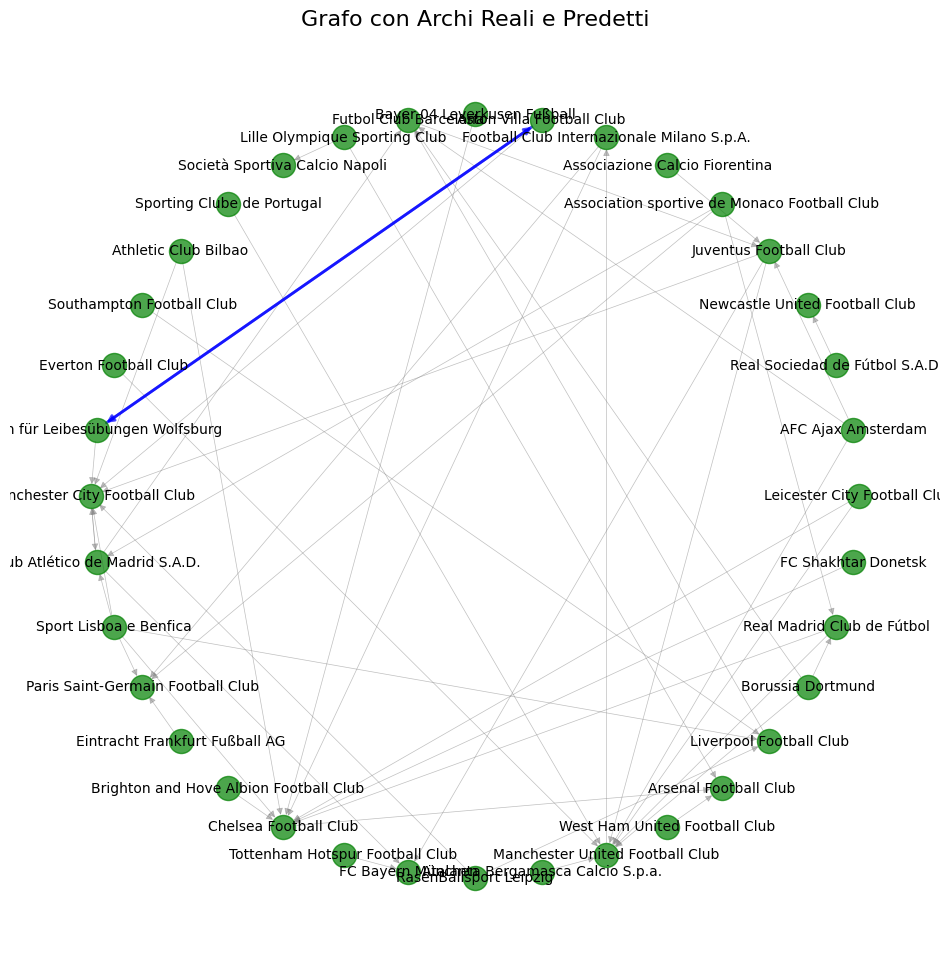

Numero di archi predetti: 2


In [115]:
import matplotlib.pyplot as plt
import networkx as nx

# Supponiamo che 'similarities' contenga le similarità tra i nodi, calcolate tramite un algoritmo di embedding o una metrica di similarità
threshold = 0.9972  # Soglia di similarità

# Lista per gli archi predetti
predicted_edges = []

# Aggiungi archi predetti se la similarità tra i nodi supera la soglia
for (node_u, node_v), sim in sorted_similarities:  # sorted_similarities è una lista di tuple (nodo_u, nodo_v, similarità)
    if sim > threshold and not G_expensive.has_edge(node_u, node_v):
        predicted_edges.append((node_u, node_v))

# Crea un nuovo grafo per la visualizzazione
G_vis = G_expensive.copy()

# Aggiungi solo gli archi predetti al grafo
G_vis.add_edges_from(predicted_edges)

# Definisci un layout uniforme per i nodi
pos = nx.shell_layout(G_expensive)  # 'seed' per rendere il layout riproducibile

# Ottieni gli archi reali dal grafo (archi esistenti)
real_edges = list(G_expensive.edges())

# Verifica che i nodi reali siano presenti anche nel grafo visibile (G_vis)
real_edges = [(u, v) for u, v in real_edges if u in G_vis.nodes() and v in G_vis.nodes()]

# Visualizza il grafo con colori diversi per gli archi reali e predetti
plt.figure(figsize=(12, 12))

# Disegna gli archi reali (in nero)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=real_edges, edge_color="gray", width=0.5, alpha=0.5
)

# Disegna gli archi predetti (in blu)
nx.draw_networkx_edges(
    G_vis, pos, edgelist=predicted_edges, edge_color="blue", width=2, alpha=0.7
)

# Assegna un colore uniforme per i nodi (puoi usare un colore personalizzato)
node_colors = ['green']

# Disegna i nodi
nx.draw_networkx_nodes(G_vis, pos, node_color=node_colors, node_size=300, alpha=0.7)

# Disegna le etichette dei nodi
nx.draw_networkx_labels(G_vis, pos, font_size=10)

plt.title("Grafo con Archi Reali e Predetti", fontsize=16)
plt.axis("off")  # Rimuovi gli assi per una visualizzazione più pulita
plt.show()

# Stampa il numero di archi predetti
print(f"Numero di archi predetti: {len(predicted_edges)}")